# TFM Implementación

En este notebook entrenaremos un modelo de deep learning para segmentacion automatica de lesiones en esclerosis multiple longitudinal. Se utilizara la herramienta open-source nnUNet https://github.com/MIC-DKFZ/nnUNet para el entrenamiento del modelo y los datos de imagenes del desafio *Longitudinal Multiple Sclerosis Lesion Segmentation Challenge - MICCAI 2021.* disponible en https://portal.fli-iam.irisa.fr/msseg-2/challenge-day/

## Instalación y configuración


In [1]:
# Montamos el repositorio de google drive para cargar el dataset
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# accedemos a la carpeta del TFM
%cd /content/drive/MyDrive/TFM
!pwd
!ls -a

/content/drive/MyDrive/TFM
/content/drive/MyDrive/TFM
.ipynb_checkpoints  nnUNet  Spatio-temporal-MS-Lesion-Segmentation
miccai		    saved


In [ ]:
# clonamos el repositorio de la implementación nnUNet
!git clone https://github.com/MIC-DKFZ/nnUNet.git

Cloning into 'nnUNet'...
remote: Enumerating objects: 5789, done.
remote: Counting objects: 100% (2447/2447), done.
remote: Compressing objects: 100% (434/434), done.
remote: Total 5789 (delta 2212), reused 2025 (delta 2013), pack-reused 3342
Receiving objects: 100% (5789/5789), 1.46 MiB | 5.48 MiB/s, done.
Resolving deltas: 100% (4564/4564), done.
Checking out files: 100% (289/289), done.


In [ ]:
# verificamos el contenido
!pwd
!ls -a

/content/drive/MyDrive/TFM
.ipynb_checkpoints  nnUNet  Spatio-temporal-MS-Lesion-Segmentation
miccai		    saved


In [ ]:
%cd nnUNet
!ls -l

/content/drive/MyDrive/TFM/nnUNet
total 8858
drwx------ 2 root root    4096 Apr 12 15:39  data
drwx------ 2 root root    4096 Apr 12 00:04  documentation
-rw------- 1 root root   33082 Apr 12 00:04  HI_Logo.png
-rw------- 1 root root   11427 Apr 12 00:04  LICENSE
drwx------ 2 root root    4096 Apr 12 00:04  nnunet
drwx------ 2 root root    4096 Apr 12 00:09  nnunet.egg-info
-rw------- 1 root root   29240 Apr 12 00:04  readme.md
-rw------- 1 root root     880 Apr 30 20:43  requirements.txt
-rw------- 1 root root      39 Apr 12 00:04  setup.cfg
-rw------- 1 root root    3058 Apr 12 00:04  setup.py
drwx------ 2 root root    4096 Apr 12 00:04  tests
-rw------- 1 root root 8970170 Apr 22 14:07 'TFM Implementacion nnunet.ipynb'


In [ ]:
# creamos el entorno virtual
!pip install virtualenv

     |████████████████████████████████| 8.8 MB 14.3 MB/s 
     |████████████████████████████████| 461 kB 76.3 MB/s 


In [ ]:
!virtualenv .env

created virtual environment CPython3.7.13.final.0-64 in 46856ms
  creator CPython3Posix(dest=/content/drive/MyDrive/TFM/nnUNet/.env, clear=False, no_vcs_ignore=False, global=False)
  seeder FromAppData(download=False, pip=bundle, setuptools=bundle, wheel=bundle, via=copy, app_data_dir=/root/.local/share/virtualenv)
    added seed packages: MedPy==0.4.0, Pillow==9.1.0, PyWavelets==1.3.0, SimpleITK==2.1.1, argparse==1.4.0, batchgenerators==0.23, certifi==2021.10.8, charset_normalizer==2.0.12, cycler==0.11.0, dicom2nifti==2.3.2, fonttools==4.32.0, future==0.18.2, hiddenlayer==0.2, idna==3.3, imageio==2.16.2, joblib==1.1.0, kiwisolver==1.4.2, linecache2==1.0.0, matplotlib==3.5.1, networkx==2.6.3, nibabel==3.2.2, numpy==1.21.5, packaging==21.3, pandas==1.3.5, pip==22.0.4, pydicom==2.3.0, pyparsing==3.0.8, python_dateutil==2.8.2, pytz==2022.1, requests==2.27.1, scikit_image==0.19.2, scikit_learn==1.0.2, scipy==1.7.3, setuptools==62.1.0, six==1.16.0, sklearn==0.0, threadpoolctl==3.1.0, tifffi

In [ ]:
# instalamos las dependencias del proyecto nnUNet
!source .env/bin/activate; pip install -e .

Obtaining file:///content/drive/MyDrive/TFM/nnUNet
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 750.6/750.6 MB 2.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.4/78.4 KB 10.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.5/13.5 MB 45.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 151.8/151.8 KB 18.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 38.1/38.1 MB 25.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.5/57.5 KB 7.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.7/15.7 MB 29.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 48.4/48.4 MB 22.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.3/11.3 MB 40.5 MB/s eta 0:00:00
     ━━━━━━━━━━━

In [ ]:
!source .env/bin/activate; pip install --upgrade git+https://github.com/FabianIsensee/hiddenlayer.git@more_plotted_details#egg=hiddenlayer

  Cloning https://github.com/FabianIsensee/hiddenlayer.git (to revision more_plotted_details) to /tmp/pip-install-stn3jhtx/hiddenlayer_829a200275314a6c93aa8cf410975831
  Running command git clone --filter=blob:none --quiet https://github.com/FabianIsensee/hiddenlayer.git /tmp/pip-install-stn3jhtx/hiddenlayer_829a200275314a6c93aa8cf410975831
  Running command git checkout -b more_plotted_details --track origin/more_plotted_details
  Switched to a new branch 'more_plotted_details'
  Branch 'more_plotted_details' set up to track remote branch 'more_plotted_details' from 'origin'.
  Resolved https://github.com/FabianIsensee/hiddenlayer.git to commit 4b98f9e5cccebac67368f02b95f4700b522345b1
  Preparing metadata (setup.py) ... done
  Created wheel for hiddenlayer: filename=hiddenlayer-0.2-py3-none-any.whl size=19816 sha256=df719900f9c80c11632cf17b8821455df1b0b3d80b43080cb52aaa98782d5576
  Stored in directory: /tmp/pip-ephem-wheel-cache-tulzqjkh/wheels/5a/33/d2/032c79ea1781f04ec9afb31c8b70840

In [ ]:
!chmod 755 -R .env/bin/

In [ ]:
# verificamos librerias instaladas
!source .env/bin/activate; pip list; python --version

Package            Version   Editable project location
------------------ --------- ---------------------------------
batchgenerators    0.23
certifi            2021.10.8
charset-normalizer 2.0.12
cycler             0.11.0
dicom2nifti        2.3.2
fonttools          4.32.0
future             0.18.2
hiddenlayer        0.2
idna               3.3
imageio            2.16.2
joblib             1.1.0
kiwisolver         1.4.2
linecache2         1.0.0
matplotlib         3.5.1
MedPy              0.4.0
networkx           2.6.3
nibabel            3.2.2
nnunet             1.7.0     /content/drive/MyDrive/TFM/nnUNet
numpy              1.21.5
packaging          21.3
pandas             1.3.5
Pillow             9.1.0
pip                22.0.4
pydicom            2.3.0
pyparsing          3.0.8
python-dateutil    2.8.2
pytz               2022.1
PyWavelets         1.3.0
requests           2.27.1
scikit-image       0.19.2
scikit-learn       1.0.2
scipy              1.7.3
setuptools         62.1.0
SimpleITK 

In [ ]:
!source .env/bin/activate; pip freeze

batchgenerators==0.23
certifi==2021.10.8
charset-normalizer==2.0.12
cycler==0.11.0
dicom2nifti==2.3.2
fonttools==4.32.0
future==0.18.2
hiddenlayer @ git+https://github.com/FabianIsensee/hiddenlayer.git@4b98f9e5cccebac67368f02b95f4700b522345b1
idna==3.3
imageio==2.16.2
joblib==1.1.0
kiwisolver==1.4.2
linecache2==1.0.0
matplotlib==3.5.1
MedPy==0.4.0
networkx==2.6.3
nibabel==3.2.2
-e git+https://github.com/MIC-DKFZ/nnUNet.git@8e0ad8ebe0b24165419d087d4451b4631f5b37f2#egg=nnunet
numpy==1.21.5
packaging==21.3
pandas==1.3.5
Pillow==9.1.0
pydicom==2.3.0
pyparsing==3.0.8
python-dateutil==2.8.2
pytz==2022.1
PyWavelets==1.3.0
requests==2.27.1
scikit-image==0.19.2
scikit-learn==1.0.2
scipy==1.7.3
SimpleITK==2.1.1
six==1.16.0
sklearn==0.0
threadpoolctl==3.1.0
tifffile==2021.11.2
torch==1.11.0
tqdm==4.64.0
traceback2==1.4.0
typing_extensions==4.1.1
unittest2==1.1.0
urllib3==1.26.9


nnU-Net necesita saber dónde pretende guardar los datos brutos, los datos preprocesados y los modelos entrenados. Para ello es necesario establecer algunas variables de entorno.

In [ ]:
import os
# agregamos variables de entorno  
os.environ['nnUNet_raw_data_base'] = "data/nnUNet_raw"
os.environ['nnUNet_preprocessed'] ="data/nnUNet_preprocessed"
os.environ['RESULTS_FOLDER'] = "data/nnUNet_trained_models"

### Conversión del dataset

nnU-Net requiere que los datos brutos se introduzcan en un formato específico para saber cómo leerlos e interpretarlos. Este formato sigue de cerca, aunque no del todo, el formato utilizado por el Decatlón de Segmentación Médica (MSD).

Este es el ejemplo de la tarea de segmentación creada para este proyecto, que sólo tiene la modalidad FLAIR y dos puntos temporales:


```
nnUNet_raw_data_base/nnUNet_raw_data/Task001_EM/
├── dataset.json
├── imagesTr
│   ├── EM_003_0000.nii.gz
│   ├── EM_003_0001.nii.gz
│   ├── ...
├── imagesTs
│   ├── EM_001_0000.nii.gz
│   ├── EM_001_0001.nii.gz
│   ├── ...
└── labelsTr
    ├── EM_003.nii.gz
    ├── ...
```



In [ ]:
# movemos los datos a la ruta correspondiente
!mv data/Task001_EM/*time01* data/nnUNet_raw/Task001_EM/imagesTr
!mv data/Task001_EM/*time02* data/nnUNet_raw/Task001_EM/imagesTr
!mv data/Task001_EM/*mask* data/nnUNet_raw/Task001_EM/labelsTr

In [ ]:
from pathlib import Path
root = Path("/content/drive/MyDrive/TFM/nnUNet/data/nnUNet_raw/Task001_EM/imagesTr")
# root = Path("/content/drive/MyDrive/TFM/nnUNet/data/nnUNet_raw/Task001_EM/labelsTr")

In [ ]:
# renombramos los ficheros de las mascaras de entrenamiento
!rename 's/mask//g' /content/drive/MyDrive/TFM/nnUNet/data/nnUNet_raw/Task001_EM/labelsTr/*;
# !rename 's/_.nii.gz/.nii.gz/g' /content/drive/MyDrive/TFM/nnUNet/data/nnUNet_raw/Task001_EM/labelsTr/*;

In [ ]:
# renombramos los ficheros de los dos puntos temporales
!rename 's/time01_FL/0000/g' /content/drive/MyDrive/TFM/nnUNet/data/nnUNet_raw/Task001_EM/imagesTr/*;
!rename 's/time02_FL/0001/g' /content/drive/MyDrive/TFM/nnUNet/data/nnUNet_raw/Task001_EM/imagesTr/*;

In [ ]:
import os
from pathlib import Path
root=Path("/content/drive/MyDrive/TFM/test")
root_dest=Path("/content/drive/MyDrive/TFM/nnUNet/data/nnUNet_raw/nnUNet_raw_data/Task001_EM/imagesTs")
# ajustamos al formato especifico de las imagenes. 
for f in sorted(os.listdir(root)):
  patient = f.split('_')[0].replace('atlas','').rjust(3, '0')
  ext=f.split('FL')[1]
  
  if '_00_' in f:
    os.rename(os.path.join(root, f),
              os.path.join(root_dest, f"{'EM'}_{patient}_0000{ext}"))
  elif '_01_' in f:
    os.rename(os.path.join(root, f),
            os.path.join(root_dest, f"{'EM'}_{patient}_0001{ext}"))


El archivo dataset.json utilizado por nnU-Net es idéntico a los utilizados por el MSD. 
A continuacion, generamos el dataset.json automaticamente

In [ ]:
!source .env/bin/activate; python /content/drive/MyDrive/TFM/nnUNet/nnunet/dataset_conversion/Task001_EM.py



Please cite the following paper when using nnUNet:

Isensee, F., Jaeger, P.F., Kohl, S.A.A. et al. "nnU-Net: a self-configuring method for deep learning-based biomedical image segmentation." Nat Methods (2020). https://doi.org/10.1038/s41592-020-01008-z


If you have questions or suggestions, feel free to open an issue at https://github.com/MIC-DKFZ/nnUNet



Este es el contenido del dataset.json de la tarea EM:



```
{
    "description": "",
    "labels": {
        "0": "background",
        "1": "lesion"
    },
    "licence": "hands off!",
    "modality": {
        "0": "FLAIR",
        "1": "FLAIR"
    },
    "name": "Task001_EM",
    "numTest": 0,
    "numTraining": 40,
    "reference": "",
    "release": "0.0",
    "tensorImageSize": "4D",
    "test": [],
    "training": [
        {
            "image": "./imagesTr/EM_013.nii.gz",
            "label": "./labelsTr/EM_013.nii.gz"
        },
        {
            "image": "./imagesTr/EM_015.nii.gz",
            "label": "./labelsTr/EM_015.nii.gz"
        },
        {
            "image": "./imagesTr/EM_016.nii.gz",
            "label": "./labelsTr/EM_016.nii.gz"
        },
        {
            "image": "./imagesTr/EM_018.nii.gz",
            "label": "./labelsTr/EM_018.nii.gz"
        },
        {
            "image": "./imagesTr/EM_019.nii.gz",
            "label": "./labelsTr/EM_019.nii.gz"
        },
        {
            "image": "./imagesTr/EM_020.nii.gz",
            "label": "./labelsTr/EM_020.nii.gz"
        },
        {
            "image": "./imagesTr/EM_021.nii.gz",
            "label": "./labelsTr/EM_021.nii.gz"
        },
        {
            "image": "./imagesTr/EM_024.nii.gz",
            "label": "./labelsTr/EM_024.nii.gz"
        },
        {
            "image": "./imagesTr/EM_026.nii.gz",
            "label": "./labelsTr/EM_026.nii.gz"
        },
        {
            "image": "./imagesTr/EM_027.nii.gz",
            "label": "./labelsTr/EM_027.nii.gz"
        },
        {
            "image": "./imagesTr/EM_029.nii.gz",
            "label": "./labelsTr/EM_029.nii.gz"
        },
        {
            "image": "./imagesTr/EM_030.nii.gz",
            "label": "./labelsTr/EM_030.nii.gz"
        },
        {
            "image": "./imagesTr/EM_032.nii.gz",
            "label": "./labelsTr/EM_032.nii.gz"
        },
        {
            "image": "./imagesTr/EM_035.nii.gz",
            "label": "./labelsTr/EM_035.nii.gz"
        },
        {
            "image": "./imagesTr/EM_037.nii.gz",
            "label": "./labelsTr/EM_037.nii.gz"
        },
        {
            "image": "./imagesTr/EM_039.nii.gz",
            "label": "./labelsTr/EM_039.nii.gz"
        },
        {
            "image": "./imagesTr/EM_043.nii.gz",
            "label": "./labelsTr/EM_043.nii.gz"
        },
        {
            "image": "./imagesTr/EM_047.nii.gz",
            "label": "./labelsTr/EM_047.nii.gz"
        },
        {
            "image": "./imagesTr/EM_048.nii.gz",
            "label": "./labelsTr/EM_048.nii.gz"
        },
        {
            "image": "./imagesTr/EM_049.nii.gz",
            "label": "./labelsTr/EM_049.nii.gz"
        },
        {
            "image": "./imagesTr/EM_051.nii.gz",
            "label": "./labelsTr/EM_051.nii.gz"
        },
        {
            "image": "./imagesTr/EM_052.nii.gz",
            "label": "./labelsTr/EM_052.nii.gz"
        },
        {
            "image": "./imagesTr/EM_057.nii.gz",
            "label": "./labelsTr/EM_057.nii.gz"
        },
        {
            "image": "./imagesTr/EM_061.nii.gz",
            "label": "./labelsTr/EM_061.nii.gz"
        },
        {
            "image": "./imagesTr/EM_068.nii.gz",
            "label": "./labelsTr/EM_068.nii.gz"
        },
        {
            "image": "./imagesTr/EM_069.nii.gz",
            "label": "./labelsTr/EM_069.nii.gz"
        },
        {
            "image": "./imagesTr/EM_070.nii.gz",
            "label": "./labelsTr/EM_070.nii.gz"
        },
        {
            "image": "./imagesTr/EM_074.nii.gz",
            "label": "./labelsTr/EM_074.nii.gz"
        },
        {
            "image": "./imagesTr/EM_077.nii.gz",
            "label": "./labelsTr/EM_077.nii.gz"
        },
        {
            "image": "./imagesTr/EM_083.nii.gz",
            "label": "./labelsTr/EM_083.nii.gz"
        },
        {
            "image": "./imagesTr/EM_084.nii.gz",
            "label": "./labelsTr/EM_084.nii.gz"
        },
        {
            "image": "./imagesTr/EM_088.nii.gz",
            "label": "./labelsTr/EM_088.nii.gz"
        },
        {
            "image": "./imagesTr/EM_089.nii.gz",
            "label": "./labelsTr/EM_089.nii.gz"
        },
        {
            "image": "./imagesTr/EM_090.nii.gz",
            "label": "./labelsTr/EM_090.nii.gz"
        },
        {
            "image": "./imagesTr/EM_091.nii.gz",
            "label": "./labelsTr/EM_091.nii.gz"
        },
        {
            "image": "./imagesTr/EM_094.nii.gz",
            "label": "./labelsTr/EM_094.nii.gz"
        },
        {
            "image": "./imagesTr/EM_095.nii.gz",
            "label": "./labelsTr/EM_095.nii.gz"
        },
        {
            "image": "./imagesTr/EM_096.nii.gz",
            "label": "./labelsTr/EM_096.nii.gz"
        },
        {
            "image": "./imagesTr/EM_099.nii.gz",
            "label": "./labelsTr/EM_099.nii.gz"
        },
        {
            "image": "./imagesTr/EM_100.nii.gz",
            "label": "./labelsTr/EM_100.nii.gz"
        }
    ]
}
```



Verificamos el dispositivo GPU disponible para poder entrenar el modelo, ya que es inviable entrenar este tipo modelos de segmentacion 3D sin GPU

In [ ]:
from tensorflow.python.client import device_lib
device_lib.list_local_devices()

[name: "/device:CPU:0"
 device_type: "CPU"
 memory_limit: 268435456
 locality {
 }
 incarnation: 8099775018320521679
 xla_global_id: -1, name: "/device:GPU:0"
 device_type: "GPU"
 memory_limit: 16154099712
 locality {
   bus_id: 1
   links {
   }
 }
 incarnation: 152556929323953576
 physical_device_desc: "device: 0, name: Tesla P100-PCIE-16GB, pci bus id: 0000:00:04.0, compute capability: 6.0"
 xla_global_id: 416903419]

### Planificación y preprocesamiento del experimento

Como primer paso, nnU-Net extrae una huella dactilar del conjunto de datos (un conjunto de propiedades específicas del conjunto de datos, como el tamaño de las imágenes, los espacios entre los vóxeles, la información sobre la intensidad, etc.). Esta información se utiliza para crear tres configuraciones de U-Net: una U-Net 2D, una U-Net 3D que opera con imágenes de resolución completa, así como una U-Net 3D en cascada en la que la primera U-Net crea un mapa de segmentación grueso en imágenes de muestreo reducido que luego es refinado por la segunda U-Net.


In [ ]:
# se crean las configuraciones de U-Net y se verifica la integridad de los datos.
!source .env/bin/activate; nnUNet_plan_and_preprocess -t 001 --verify_dataset_integrity



Please cite the following paper when using nnUNet:

Isensee, F., Jaeger, P.F., Kohl, S.A.A. et al. "nnU-Net: a self-configuring method for deep learning-based biomedical image segmentation." Nat Methods (2020). https://doi.org/10.1038/s41592-020-01008-z


If you have questions or suggestions, feel free to open an issue at https://github.com/MIC-DKFZ/nnUNet

Verifying training set
checking case EM_013
checking case EM_015
checking case EM_016
checking case EM_018
checking case EM_019
checking case EM_020
checking case EM_021
checking case EM_024
checking case EM_026
checking case EM_027
checking case EM_029
checking case EM_030
checking case EM_032
checking case EM_035
checking case EM_037
checking case EM_039
checking case EM_043
checking case EM_047
checking case EM_048
checking case EM_049
checking case EM_051
checking case EM_052
checking case EM_057
checking case EM_061
checking case EM_068
checking case EM_069
checking case EM_070
checking case EM_074
checking case EM_077
checki

## Entrenamiento del modelo

nnU-Net entrena todas las configuraciones de U-Net en una validación cruzada de 5 veces. Esto permite a nnU-Net determinar el posprocesamiento y el ensamblaje en el conjunto de datos de entrenamiento. Para este proyecto se ha utilizado una arquitectura 3D U-Net para entrenar el modelo y se ha especificado para el entrenamiento el fold 5 de la validación cruzada para minimizar el tiempo de entrenamiento.

El entrenamiento de los modelos se realiza con el comando nnUNet_train. La estructura general del comando es:

In [ ]:
# variable de entorno para añadir el id de dispositivo gpu de la maquina
os.environ['CUDA_VISIBLE_DEVICES'] = '0'

!source .env/bin/activate; nnUNet_train 3d_fullres nnUNetTrainerV2 Task001_EM 5 --npz



Please cite the following paper when using nnUNet:

Isensee, F., Jaeger, P.F., Kohl, S.A.A. et al. "nnU-Net: a self-configuring method for deep learning-based biomedical image segmentation." Nat Methods (2020). https://doi.org/10.1038/s41592-020-01008-z


If you have questions or suggestions, feel free to open an issue at https://github.com/MIC-DKFZ/nnUNet

Matplotlib is building the font cache; this may take a moment.
###############################################
I am running the following nnUNet: 3d_fullres
My trainer class is:  <class 'nnunet.training.network_training.nnUNetTrainerV2.nnUNetTrainerV2'>
For that I will be using the following configuration:
num_classes:  1
modalities:  {0: 'FLAIR', 1: 'FLAIR'}
use_mask_for_norm OrderedDict([(0, True), (1, True)])
keep_only_largest_region None
min_region_size_per_class None
min_size_per_class None
normalization_schemes OrderedDict([(0, 'nonCT'), (1, 'nonCT')])
stages...

stage:  0
{'batch_size': 2, 'num_pool_per_axis': [4, 5, 5], 'p

In [ ]:
os.environ['CUDA_VISIBLE_DEVICES'] = '0'
# continuamos el entrenamiento desde el ultimo checkpoint
!source .env/bin/activate; nnUNet_train -c 3d_fullres nnUNetTrainerV2 Task001_EM 5 --npz

Streaming output truncated to the last 5000 lines.
case does not contain any foreground classes EM_052
case does not contain any foreground classes EM_096
case does not contain any foreground classes EM_052
case does not contain any foreground classes EM_049
case does not contain any foreground classes EM_052
case does not contain any foreground classes EM_096
case does not contain any foreground classes EM_049
case does not contain any foreground classes EM_070
case does not contain any foreground classes EM_096
case does not contain any foreground classes EM_049
case does not contain any foreground classes EM_049
case does not contain any foreground classes EM_049
case does not contain any foreground classes EM_096
case does not contain any foreground classes EM_090
case does not contain any foreground classes EM_052
case does not contain any foreground classes EM_049
case does not contain any foreground classes EM_049
case does not contain any foreground classes EM_049
case does not

### Identificar la mejor configuración de U-Net

Una vez entrenados todos los modelos, utilice el siguiente comando para determinar automáticamente qué configuración U-Net debe utilizarse para la predicción del conjunto de pruebas:

In [ ]:
# !source .env/bin/activate; nnUNet_train -c 3d_fullres nnUNetTrainerV2 Task001_EM 5 --npz
!source .env/bin/activate; nnUNet_find_best_configuration -m 3d_fullres -t 001



Please cite the following paper when using nnUNet:

Isensee, F., Jaeger, P.F., Kohl, S.A.A. et al. "nnU-Net: a self-configuring method for deep learning-based biomedical image segmentation." Nat Methods (2020). https://doi.org/10.1038/s41592-020-01008-z


If you have questions or suggestions, feel free to open an issue at https://github.com/MIC-DKFZ/nnUNet

running missing postprocessing for Task001_EM and model 3d_fullres
Traceback (most recent call last):
  File "/content/drive/MyDrive/TFM/nnUNet/.env/bin/nnUNet_find_best_configuration", line 33, in <module>
    sys.exit(load_entry_point('nnunet', 'console_scripts', 'nnUNet_find_best_configuration')())
  File "/content/drive/MyDrive/TFM/nnUNet/nnunet/evaluation/model_selection/figure_out_what_to_submit.py", line 144, in main
    consolidate_folds(output_folder, folds=folds)
  File "/content/drive/MyDrive/TFM/nnUNet/nnunet/postprocessing/consolidate_postprocessing.py", line 62, in consolidate_folds
    folds)
  File "/content/drive/

nnUNet requiere que se completen para todas las configuraciones especificadas de los 5 folds, pero al no disponer de todos los modelos entrenados, ya que solo se ha entrenado un modelo (fold=5), el comando anterior no se puede ejecutar. Para este trabajo se ha seleccionado el mejor modelo entrenado en el fold=5.

A continuación, analizamos el progreso del rendimiento del modelo entrenado.

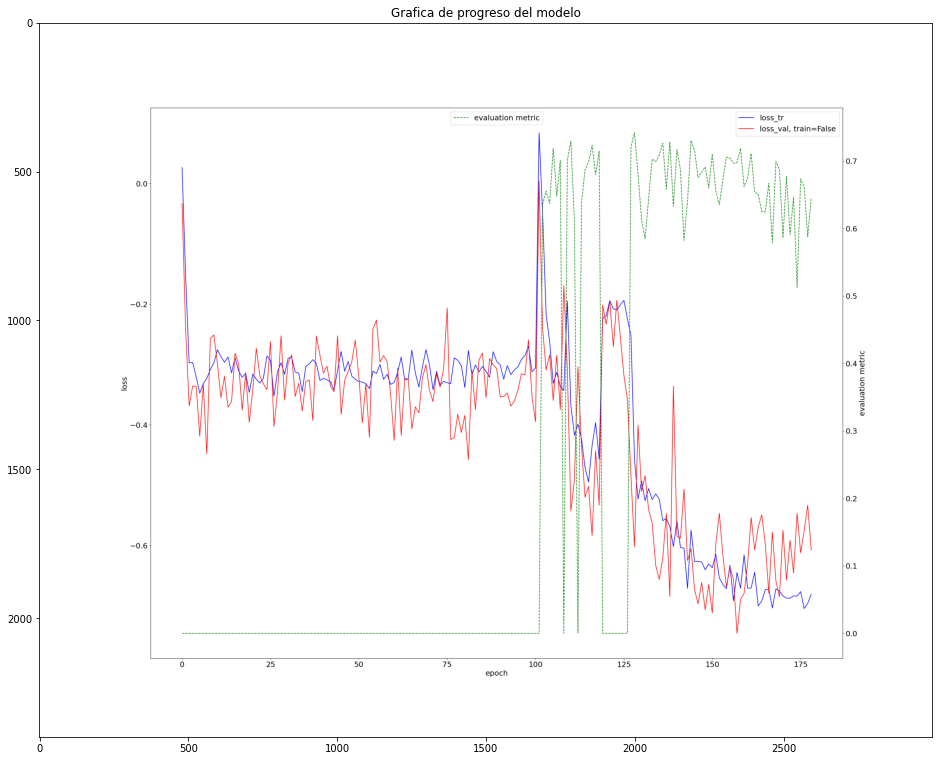

In [129]:
img_path='/content/progress.png'
img=plt.imread(img_path)
fig, ax = plt.subplots(figsize=(16, 16))
ax.imshow(img)
_=ax.set_title('Grafica de progreso del modelo')

A partir de los resultados de la gráfica anterior, se puede observar que la métrica de evaluación aumenta después de las 100 épocas, llegando al valor de 0.7, a su vez la función de perdida de entrenamiento y de validación decrecen hasta alcanzar el 0.1 aproximadamente sobre las 155 épocas, momento en el cual el modelo se estanca y no se observa una mejora, alrededor de la época 175 se observa que la función de perdida de entrenamiento decrece pero la de validación aumenta, lo que implica que la red neuronal está sufriendo overfitting. Por lo tanto, el mejor modelo encontrado por la red está en torno a la época 150.

## Inferencia del modelo

Los datos ubicados en la carpeta de entrada deben ajustarse al formato especificado anteriormente.

Para ejecutar la inferencia utilice el siguiente comando:

In [ ]:
# realizamos le prediccion sobre el conjunto de entrenamiento. proporcionando las carpetas de entrada y salida.
!source .env/bin/activate; nnUNet_predict -i data/nnUNet_raw/nnUNet_raw_data/Task001_EM/imagesTr -o data/nnUNet_raw/nnUNet_raw_data/Task001_EM/output -t 001 -m 3d_fullres -f 5 --save_npz




Please cite the following paper when using nnUNet:

Isensee, F., Jaeger, P.F., Kohl, S.A.A. et al. "nnU-Net: a self-configuring method for deep learning-based biomedical image segmentation." Nat Methods (2020). https://doi.org/10.1038/s41592-020-01008-z


If you have questions or suggestions, feel free to open an issue at https://github.com/MIC-DKFZ/nnUNet

using model stored in  data/nnUNet_trained_models/nnUNet/3d_fullres/Task001_EM/nnUNetTrainerV2__nnUNetPlansv2.1
This model expects 2 input modalities for each image
Found 40 unique case ids, here are some examples: ['EM_021' 'EM_049' 'EM_019' 'EM_016' 'EM_026' 'EM_039' 'EM_061' 'EM_013'
 'EM_047' 'EM_039']
If they don't look right, make sure to double check your filenames. They must end with _0000.nii.gz etc
number of cases: 40
number of cases that still need to be predicted: 40
emptying cuda cache
loading parameters for folds, [5]
using the following model files:  ['data/nnUNet_trained_models/nnUNet/3d_fullres/Task001_EM/nnUNetTr

In [ ]:

# realizamos le prediccion sobre el conjunto de test. proporcionando las carpetas de entrada y salida.
!source .env/bin/activate; nnUNet_predict -i data/nnUNet_raw/nnUNet_raw_data/Task001_EM/imagesTs -o data/nnUNet_raw/nnUNet_raw_data/Task001_EM/output_test -t 001 -m 3d_fullres -f 5 --save_npz




Please cite the following paper when using nnUNet:

Isensee, F., Jaeger, P.F., Kohl, S.A.A. et al. "nnU-Net: a self-configuring method for deep learning-based biomedical image segmentation." Nat Methods (2020). https://doi.org/10.1038/s41592-020-01008-z


If you have questions or suggestions, feel free to open an issue at https://github.com/MIC-DKFZ/nnUNet

Matplotlib is building the font cache; this may take a moment.
using model stored in  data/nnUNet_trained_models/nnUNet/3d_fullres/Task001_EM/nnUNetTrainerV2__nnUNetPlansv2.1
This model expects 2 input modalities for each image
Found 83 unique case ids, here are some examples: ['EM_051' 'EM_082' 'EM_080' 'EM_064' 'EM_068' 'EM_040' 'EM_062' 'EM_024'
 'EM_081' 'EM_028']
If they don't look right, make sure to double check your filenames. They must end with _0000.nii.gz etc
number of cases: 83
number of cases that still need to be predicted: 83
emptying cuda cache
loading parameters for folds, [5]
using the following model files:  ['d

## Visualizacion de resultados

### Instalación y configuración 

Instalamos las librerias necesarias para la visualizacion de datos

In [2]:
!pip install celluloid

In [3]:
from pathlib import Path
import nibabel as nib
import numpy as np
import matplotlib.pyplot as plt
from celluloid import Camera
from tqdm.notebook import tqdm
import cv2
import glob

import matplotlib.pyplot as plt
import numpy as np

plt.rcParams.update({'figure.max_open_warning': 0})

In [4]:
# definimos las rutas de los ficheros.
root_img = Path('/content/drive/MyDrive/TFM/nnUNet/data/nnUNet_raw/nnUNet_raw_data/Task001_EM/imagesTr')
root_pred = Path('/content/drive/MyDrive/TFM/nnUNet/data/nnUNet_raw/nnUNet_raw_data/Task001_EM/output')
root_mask = Path('/content/drive/MyDrive/TFM/nnUNet/data/nnUNet_raw/nnUNet_raw_data/Task001_EM/labelsTr')
root_img_test = Path('/content/drive/MyDrive/TFM/nnUNet/data/nnUNet_raw/nnUNet_raw_data/Task001_EM/imagesTs')
root_pred_test = Path('/content/drive/MyDrive/TFM/nnUNet/data/nnUNet_raw/nnUNet_raw_data/Task001_EM/output_test')
rimg = '/content/MNI152_T1_1mm_brain.nii.gz'

### Dataset entrenamiento

Exploramos el dataset el dataset de entrenamiento 

In [78]:
s=len(sorted(root_pred.glob("EM_*.nii.gz")))
lesions={}
c=0
print('listado de sujetos sin lesiones en el ground truth: \n')
for idx, name in enumerate(list(sorted(root_pred.glob("EM_*.nii.gz")))):
  # cargamos el ground truth 
  sample_path_label = list(sorted(root_mask.glob("*EM_*")))[idx]
  data_label = nib.load(sample_path_label)
  label = data_label.get_fdata()
  # cargamos la mascara predicha
  pred = nib.load(name)
  mask = pred.get_fdata()
  # sujetos sin lesion prediccion
  if len(label[label[:,:,:]!=0]) == 0:
    print(name)
    c+=1

listado de sujetos sin lesiones en el ground truth: 

/content/drive/MyDrive/TFM/nnUNet/data/nnUNet_raw/nnUNet_raw_data/Task001_EM/output/EM_015.nii.gz
/content/drive/MyDrive/TFM/nnUNet/data/nnUNet_raw/nnUNet_raw_data/Task001_EM/output/EM_019.nii.gz
/content/drive/MyDrive/TFM/nnUNet/data/nnUNet_raw/nnUNet_raw_data/Task001_EM/output/EM_049.nii.gz
/content/drive/MyDrive/TFM/nnUNet/data/nnUNet_raw/nnUNet_raw_data/Task001_EM/output/EM_051.nii.gz
/content/drive/MyDrive/TFM/nnUNet/data/nnUNet_raw/nnUNet_raw_data/Task001_EM/output/EM_052.nii.gz
/content/drive/MyDrive/TFM/nnUNet/data/nnUNet_raw/nnUNet_raw_data/Task001_EM/output/EM_068.nii.gz
/content/drive/MyDrive/TFM/nnUNet/data/nnUNet_raw/nnUNet_raw_data/Task001_EM/output/EM_070.nii.gz
/content/drive/MyDrive/TFM/nnUNet/data/nnUNet_raw/nnUNet_raw_data/Task001_EM/output/EM_084.nii.gz
/content/drive/MyDrive/TFM/nnUNet/data/nnUNet_raw/nnUNet_raw_data/Task001_EM/output/EM_089.nii.gz
/content/drive/MyDrive/TFM/nnUNet/data/nnUNet_raw/nnUNet_raw_dat

In [79]:
print('Total sujetos sin lesiones = {}, corresponde al {}% del total de {} sujetos'.format(c, round((c/s)*100,2),s))


Total sujetos sin lesiones = 11, corresponde al 27.5% del total de 40 sujetos


Seleccionamos el sujeto 43 para analizar las lesiones

In [81]:
sample_path_time01 = list(sorted(root_img.glob("*_0000*")))[16]  # Choose a subject
sample_path_time02 = list(sorted(root_img.glob("*_0001*")))[16]  # Choose a subject

sample_path_pred = list(sorted(root_pred.glob("*EM_*.nii.gz")))[16]  # Choose a subject
# sample_path_label = change_img_to_label_path(sample_path)
sample_path_label = list(sorted(root_mask.glob("*EM_*")))[16]
sample_path_pred

PosixPath('/content/drive/MyDrive/TFM/nnUNet/data/nnUNet_raw/nnUNet_raw_data/Task001_EM/output/EM_043.nii.gz')

In [98]:
data_img1 = nib.load(sample_path_time01)
data_img2 = nib.load(sample_path_time02)
data_label = nib.load(sample_path_label)

img1 = data_img1.get_fdata()
img2 = data_img2.get_fdata()
mask = data_label.get_fdata()

In [83]:
# exploramos las propiedades de la imagen nifti
print(data_img1)

<class 'nibabel.nifti1.Nifti1Image'>
data shape (182, 218, 182)
affine: 
[[  -1.    0.    0.   90.]
 [   0.    1.    0. -126.]
 [   0.    0.    1.  -72.]
 [   0.    0.    0.    1.]]
metadata:
<class 'nibabel.nifti1.Nifti1Header'> object, endian='<'
sizeof_hdr      : 348
data_type       : b''
db_name         : b''
extents         : 16384
session_error   : 0
regular         : b'r'
dim_info        : 0
dim             : [  3 182 218 182   1   1   1   1]
intent_p1       : 0.0
intent_p2       : 0.0
intent_p3       : 0.0
intent_code     : none
datatype        : float32
bitpix          : 32
slice_start     : 0
pixdim          : [-1.  1.  1.  1.  0.  0.  0.  0.]
vox_offset      : 0.0
scl_slope       : nan
scl_inter       : nan
slice_end       : 0
slice_code      : unknown
xyzt_units      : 10
cal_max         : 0.0
cal_min         : 0.0
slice_duration  : 0.0
toffset         : 0.0
glmax           : 0
glmin           : 0
descrip         : b'6.0.5:9e026117'
aux_file        : b''
qform_code      : m

In [85]:
nib.aff2axcodes(data_img1.affine)

('L', 'A', 'S')

Las orientaciones de los vóxeles son las más próximas:



1.   El primer eje del vóxel va de derecha a izquierda (plano sagital);
2.   El segundo eje de voxel va de posterior a Anterior (plano coronal);
3.   El tercer eje de voxel va de inferior a Superior (plano axial).







PLANO SAGITAL

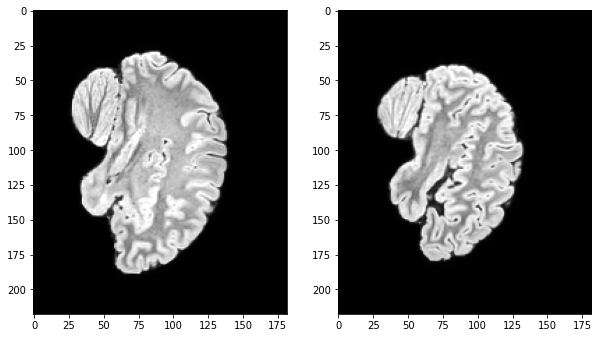

In [86]:
fig, (axis1, axis2) = plt.subplots(1 ,2, figsize=(10,12))
_=axis1.imshow(img1[60,:,:],cmap='gray')
_=axis2.imshow(img1[130,:,:],cmap='gray')

PLANO CORONAL

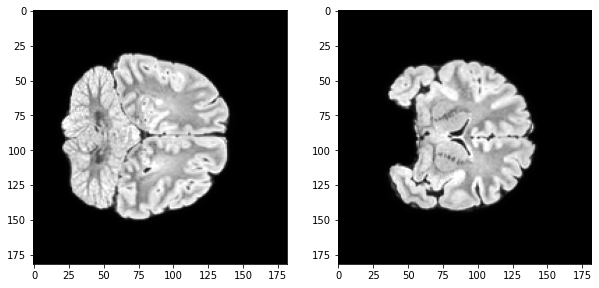

In [87]:
fig, (axis1, axis2) = plt.subplots(1 ,2, figsize=(10,12))
_=axis1.imshow(img1[:,70,:],cmap='gray')
_=axis2.imshow(img1[:,140,:],cmap='gray')

PLANO AXIAL

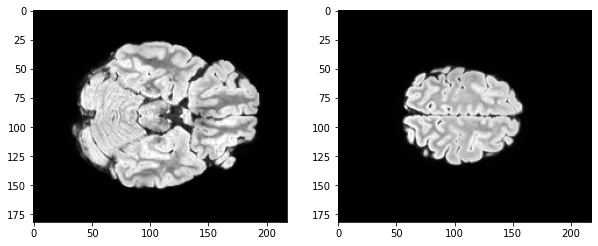

In [88]:
fig, (axis1, axis2) = plt.subplots(1 ,2, figsize=(10,12))
_=axis1.imshow(img1[:,:,60],cmap='gray')
_=axis2.imshow(img1[:,:,130],cmap='gray')

In [89]:
print('Tamaño de las lesiones en el ground truth =', np.sum(label[label[:,:,:]!=0]))

Tamaño de las lesiones en el ground truth = 271.0


mostramos cortes del plano axial del sujeto con el ground truth

/usr/local/lib/python3.7/dist-packages/matplotlib/image.py:452: UserWarning: Warning: converting a masked element to nan.
  dv = np.float64(self.norm.vmax) - np.float64(self.norm.vmin)
/usr/local/lib/python3.7/dist-packages/matplotlib/image.py:459: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
/usr/local/lib/python3.7/dist-packages/matplotlib/image.py:464: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
<string>:6: UserWarning: Warning: converting a masked element to nan.
/usr/local/lib/python3.7/dist-packages/matplotlib/colors.py:993: UserWarning: Warning: converting a masked element to nan.
  data = np.asarray(value)


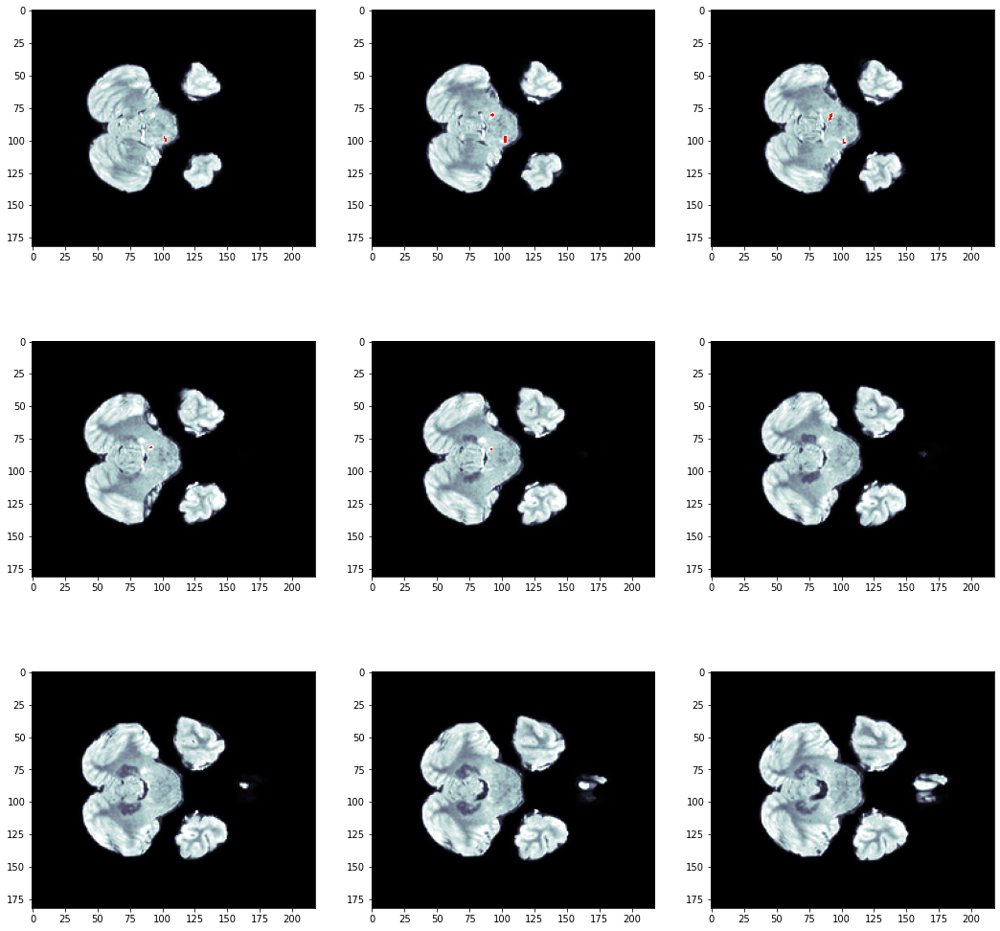

In [102]:
fig, axis = plt.subplots(3, 3, figsize=(18, 18))

slice_counter = 40
for i in range(3):
    for j in range(3):
        axis[i][j].imshow(img2[:,:,slice_counter], cmap="bone")
        mask_ = np.ma.masked_where(mask[:,:,slice_counter]==0, mask[:,:,slice_counter])
        axis[i][j].imshow(mask_ , cmap="autumn")
        slice_counter+=1


mostramos un corte del plano con las imagenes y la mascara



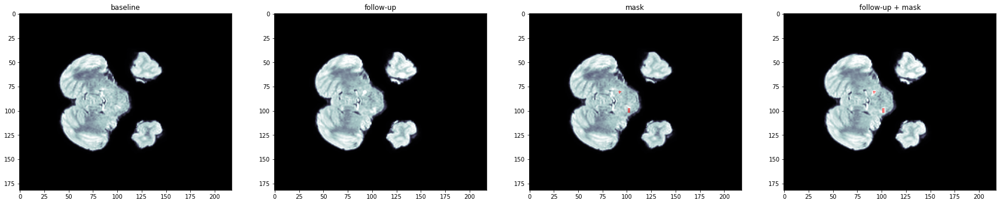

In [107]:
slice_counter = 41
fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(30, 10))

ax1.imshow(img1[:,:,slice_counter],cmap='bone')
ax1.title.set_text('baseline')
ax2.imshow(img2[:,:,slice_counter],cmap='bone')
ax2.title.set_text('follow-up')
ax3.imshow(img1[:,:,slice_counter],cmap='bone')
mask_ = np.ma.masked_where(mask[:,:,slice_counter]==0, mask[:,:,slice_counter])
ax3.imshow(mask_, alpha=0.5,cmap='autumn')
ax3.title.set_text('mask')
ax4.imshow(img2[:,:,slice_counter],cmap='bone')
mask_ = np.ma.masked_where(mask[:,:,slice_counter]==0, mask[:,:,slice_counter])
ax4.imshow(mask_, alpha=0.5,cmap='autumn')
ax4.title.set_text('follow-up + mask')
plt.show()

podemos observar diferencias en los puntos de aparicion de las lesiones entre la imagen baseline y follow-up, sobre todo en la lesion mas pequeña, podriamos decir que detecta una nueva lesion.

A continuación, creamos una animacion de la imagen follow-up y la mascara predicha

/usr/local/lib/python3.7/dist-packages/matplotlib/image.py:452: UserWarning: Warning: converting a masked element to nan.
  dv = np.float64(self.norm.vmax) - np.float64(self.norm.vmin)
/usr/local/lib/python3.7/dist-packages/matplotlib/image.py:459: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
/usr/local/lib/python3.7/dist-packages/matplotlib/image.py:464: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
<string>:6: UserWarning: Warning: converting a masked element to nan.
/usr/local/lib/python3.7/dist-packages/matplotlib/colors.py:993: UserWarning: Warning: converting a masked element to nan.
  data = np.asarray(value)


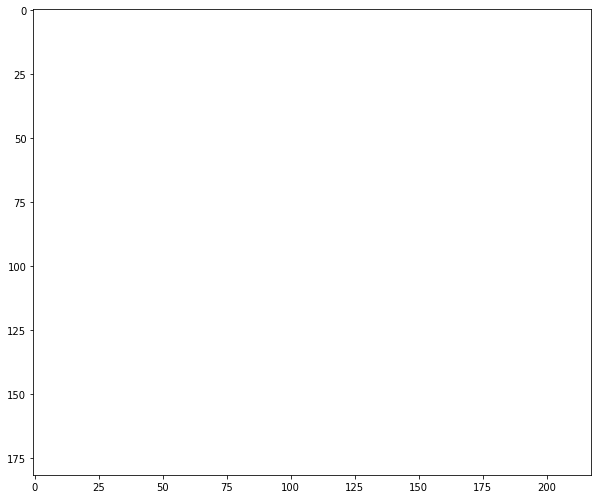

In [103]:
fig = plt.figure(figsize=(10,12))
camera = Camera(fig)  # create the camera object from celluloid

for i in range(0, img2.shape[2], 2):  # axial view
    plt.imshow(img2[:,:,i], cmap="bone")
    mask_ = np.ma.masked_where(mask[:,:,i]==0, mask[:,:,i])
    plt.imshow(mask_, cmap="autumn")
    #plt.axis("off")
    camera.snap()  # Store the current slice
animation = camera.animate()  # create the animation

In [104]:
from IPython.display import HTML
HTML(animation.to_html5_video())  # convert the animation to a video

/usr/local/lib/python3.7/dist-packages/matplotlib/image.py:452: UserWarning: Warning: converting a masked element to nan.
  dv = np.float64(self.norm.vmax) - np.float64(self.norm.vmin)
/usr/local/lib/python3.7/dist-packages/matplotlib/image.py:459: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
/usr/local/lib/python3.7/dist-packages/matplotlib/image.py:464: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
<string>:6: UserWarning: Warning: converting a masked element to nan.
/usr/local/lib/python3.7/dist-packages/matplotlib/colors.py:993: UserWarning: Warning: converting a masked element to nan.
  data = np.asarray(value)


Exploramos los resultados de la inferencia del modelo sobre el dataset de entrenamiento

In [76]:
s=len(sorted(root_pred.glob("EM_*.nii.gz")))
lesions={}
c=0
print('listado de sujetos sin lesiones detectadas en la inferencia: \n')
for idx, name in enumerate(list(sorted(root_pred.glob("EM_*.nii.gz")))):
  # cargamos el ground truth 
  sample_path_label = list(sorted(root_mask.glob("*EM_*")))[idx]
  data_label = nib.load(sample_path_label)
  label = data_label.get_fdata()
  # cargamos la mascara predicha
  pred = nib.load(name)
  mask = pred.get_fdata()
  # sujetos sin lesion prediccion
  if len(mask[mask[:,:,:]!=0]) == 0:
    print(name)
    c+=1
  # sujetos (ground truth) con lesion y mascara predicha sin lesion
  if len(label[label[:,:,:]!=0]) > 0 and len(mask[mask[:,:,:]!=0]) == 0:
    lesions[idx] = str(sample_path_label).split('/')[-1]


listado de sujetos sin lesiones detectadas en la inferencia: 

/content/drive/MyDrive/TFM/nnUNet/data/nnUNet_raw/nnUNet_raw_data/Task001_EM/output/EM_015.nii.gz
/content/drive/MyDrive/TFM/nnUNet/data/nnUNet_raw/nnUNet_raw_data/Task001_EM/output/EM_018.nii.gz
/content/drive/MyDrive/TFM/nnUNet/data/nnUNet_raw/nnUNet_raw_data/Task001_EM/output/EM_019.nii.gz
/content/drive/MyDrive/TFM/nnUNet/data/nnUNet_raw/nnUNet_raw_data/Task001_EM/output/EM_032.nii.gz
/content/drive/MyDrive/TFM/nnUNet/data/nnUNet_raw/nnUNet_raw_data/Task001_EM/output/EM_049.nii.gz
/content/drive/MyDrive/TFM/nnUNet/data/nnUNet_raw/nnUNet_raw_data/Task001_EM/output/EM_051.nii.gz
/content/drive/MyDrive/TFM/nnUNet/data/nnUNet_raw/nnUNet_raw_data/Task001_EM/output/EM_052.nii.gz
/content/drive/MyDrive/TFM/nnUNet/data/nnUNet_raw/nnUNet_raw_data/Task001_EM/output/EM_068.nii.gz
/content/drive/MyDrive/TFM/nnUNet/data/nnUNet_raw/nnUNet_raw_data/Task001_EM/output/EM_070.nii.gz
/content/drive/MyDrive/TFM/nnUNet/data/nnUNet_raw/nnUNe

In [6]:
print('Total sujetos sin lesiones = {}, corresponde al {}% del total de {} sujetos'.format(c, round((c/s)*100,2),s))
print('\nSujetos (ground truth) con lesion y mascara predicha sin lesion ', lesions)

Total sujetos sin lesiones = 14, corresponde al 35.0% del total de 40 sujetos

Sujetos (ground truth) con lesion y mascara predicha sin lesion  {3: 'EM_018.nii.gz', 12: 'EM_032.nii.gz', 31: 'EM_088.nii.gz'}


Se puede ver que el modelo no ha sido capaz de detectar lesion en 3 sujetos que si tienen lesion, ¿estos casos de falso negativo se debe quiza a que son lesiones pequeñas? y en donde nuestro modelo no captura los patrones representativos 

In [7]:
s=len(sorted(root_pred.glob("EM_*.nii.gz")))
size_pred=[]
size_label=[]
c=0

for idx, name in enumerate(list(sorted(root_pred.glob("EM_*.nii.gz")))):
  # cargamos el ground truth 
  sample_path_label = list(sorted(root_mask.glob("*EM_*")))[idx]
  data_label = nib.load(sample_path_label)
  label = data_label.get_fdata()
  # cargamos la mascara predicha
  pred = nib.load(name)
  mask = pred.get_fdata()
  # sumamos el tamaño total de las lesiones
  size_label.append(np.sum(label[label[:,:,:]!=0]))
  size_pred.append(np.sum(mask[mask[:,:,:]!=0]))


In [9]:
import pandas as pd
%matplotlib inline
plt.style.use('fivethirtyeight')
plt.rcParams['figure.figsize'] = (12, 9)
df = pd.DataFrame({'size_pred':size_pred,'size_label':size_label})

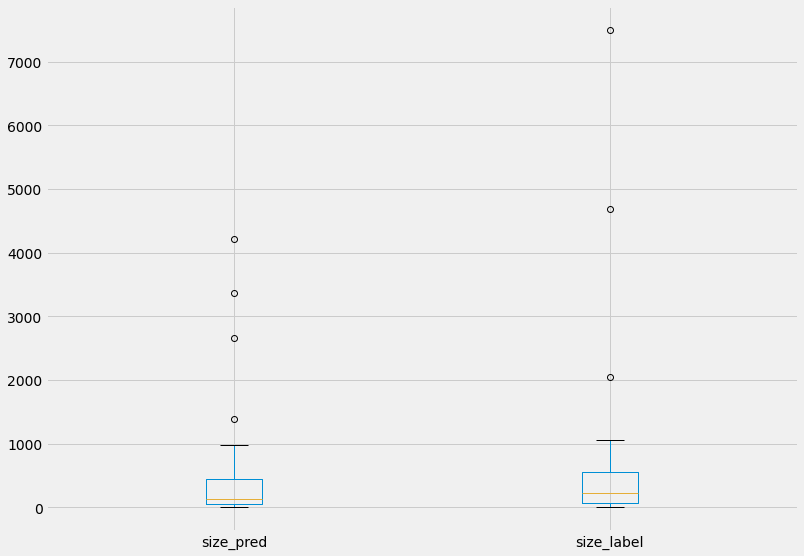

In [10]:
df[df.size_label != 0].boxplot()

se puede observar que el modelo predice menos lesiones que el ground truth y el tamaño de las lesiones es menor, ademas se detectan algunos valores atipicos de casos de sujetos con muchas lesiones. 

In [139]:
df[(df.size_label != 0) & (df.size_label < 300)]

,size_pred,size_label
0,27.0,20.0
3,0.0,220.0
5,93.0,49.0
10,54.0,205.0
11,125.0,135.0
12,0.0,24.0
13,98.0,114.0
14,15.0,12.0
16,116.0,271.0
17,12.0,11.0


como se puede observar el sujeto con indice 12 y 31 tienen un tamaño de lesiones pequeño, sin embargo el sujeto 17 es el mas pequeño y el modelo parece que si fue capaz de predecir la lesion.

#### Metricas de evaluación 

A continuación, implementamos las funciones de perdida DICE y JACCARD.

In [6]:
import torch.nn.functional as F
# funcion que retorna el coeficiente de similitud de dice
def diceLoss(pred, mask, smooth=1):
  intersection = (pred * mask).sum()                            
  dice = (2.*intersection + smooth)/(pred.sum() + mask.sum() + smooth)  
  
  return 1 - dice


In [7]:
# funcion que retorna el indice de jaccard
def IoULoss(pred, mask, smooth=1):
  intersection = (pred * mask).sum()
  total = (pred + mask).sum()
  union = total - intersection 
  
  IoU = (intersection + smooth)/(union + smooth)
          
  return 1 - IoU

#### Analisis de lesiones del dataset

Realizamos un recuento de lesiones del dataset para cada plano de la imagen 3D y obtenemos el porcentaje de aparicion de la lesion en cada punto del plano. 
Calculamos las metricas de evaluación.

In [8]:
pred3d=np.zeros((182, 218, 182))
max=0
max_idx=0
dice=[]
iou=[]

for idx in range(len(list(sorted(root_img.glob("*_0000*"))))):
  # leemos el fichero de la imagen la mascara y la prediccion
  sample_path_time01 = list(sorted(root_img.glob("*_0000*")))[idx]  # Choose a subject
  sample_path_time02 = list(sorted(root_img.glob("*_0001*")))[idx]  # Choose a subject
  sample_path_pred = list(sorted(root_pred.glob("*EM_*.nii.gz")))[idx]  # Choose a subject
  sample_path_label = list(sorted(root_mask.glob("*EM_*")))[idx]
  # cargamos la imagen, la imagen y la prediccion
  data_img1 = nib.load(sample_path_time01)
  data_img2 = nib.load(sample_path_time02)
  data_pred = nib.load(sample_path_pred)
  data_label = nib.load(sample_path_label)
  # obtenemos la matrix de datos de la imagen y la mascara binaria. 
  img1 = data_img1.get_fdata()
  img2 = data_img2.get_fdata()
  pred = data_pred.get_fdata()
  label = data_label.get_fdata()
  # calculamos las metricas de evaluación
  dice.append(diceLoss(pred, label))
  iou.append(IoULoss(pred, label))
  # sumamos todos los cortes del plano sagital y axial de la imagen 3D 
  for i in range(pred.shape[2]):  # axial view, and sagital view
      if i==0 and idx==0: # inicial
        axial=pred[:,:,i]+pred[:,:,i+1]
        axial_label=label[:,:,i]+label[:,:,i+1]
        sagital=pred[i,:,:]+pred[i+1,:,:]
        sagital_label=label[i,:,:]+label[i+1,:,:]
      elif i==0 and idx!=0: # inicial paciente
        axial+=pred[:,:,i]+pred[:,:,i+1]
        axial_label+=label[:,:,i]+label[:,:,i+1]
        sagital+=pred[i,:,:]+pred[i+1,:,:]
        sagital_label+=label[i,:,:]+label[i+1,:,:]
      elif i==pred.shape[2]-1: #final
        break
      else: # intermedio
        axial+=pred[:,:,i+1]
        axial_label+=label[:,:,i+1]
        sagital+=pred[i+1,:,:]
        sagital_label+=label[i+1,:,:]

      pred3d[:,:,i]+=pred[:,:,i]
      pred3d[i,:,:]+=pred[i,:,:]
      # guardamos el corte con mayor numero de lesiones
      if np.sum(pred[:,:,i]) > max:
        max=np.sum(pred[:,:,i])
        max_idx=i
  # sumamos todos los cortes del plano coronal de la imagen 3D 
  for i in range(pred.shape[1]):  # coronal view
      if i==0 and idx==0: # inicial
        coronal=pred[:,i,:]+pred[:,i+1,:]
        coronal_label=label[:,i,:]+label[:,i+1,:]
      elif i==0 and idx!=0: # inicial paciente
        coronal+=pred[:,i,:]+pred[:,i+1,:]
        coronal_label+=label[:,i,:]+label[:,i+1,:]
      elif i==pred.shape[1]-1: #final
        break
      else: # intermedio
        coronal+=pred[:,i+1,:]
        coronal_label+=label[:,i+1,:]

      pred3d[:,i,:]+=pred[:,i,:]
      # guardamos el corte con mayor numero de lesiones
      if np.sum(pred[:,i,:]) > max:
        max=np.sum(pred[:,i,:])
        max_idx=i
  

Resultado de la metrica de evaluación de JACCARD para cada paciente:

In [9]:
print(iou)

[0.5151515151515151, 0.0, 0.5158150851581509, 0.995475113122172, 0.0, 0.46808510638297873, 0.3857801184990125, 0.5293005671077504, 0.6203037569944045, 0.42905405405405406, 0.8190045248868778, 0.24161073825503354, 0.96, 0.5540540540540541, 0.38888888888888884, 0.4811308520295682, 0.765079365079365, 0.33333333333333337, 0.39814814814814814, 0.0, 0.0, 0.0, 0.735, 0.4617244157937147, 0.0, 0.2882588149763722, 0.0, 0.5682989690721649, 0.5411764705882354, 0.36809815950920244, 0.0, 0.9772727272727273, 0.0, 0.0, 0.4402173913043478, 0.45200698080279234, 0.4055819477434679, 0.0, 0.20408163265306123, 0.8333333333333334]


In [10]:
p=np.sum(iou) / np.nonzero(iou)[0].size
print('JACCARD = {}'.format(p))

JACCARD = 0.5405264160067147


Resultado de la metrica de evaluación de DICE para cada paciente:

In [11]:
print(dice)

[0.35416666666666663, 0.0, 0.34811165845648606, 0.995475113122172, 0.0, 0.3076923076923077, 0.23908608731130154, 0.36036036036036034, 0.4498550724637681, 0.2734122712594187, 0.6961538461538461, 0.13793103448275867, 0.96, 0.38497652582159625, 0.25, 0.31679617453676034, 0.6211340206185567, 0.20833333333333337, 0.24927536231884062, 0.0, 0.0, 0.0, 0.5814873417721519, 0.300314465408805, 0.0, 0.16843670348343243, 0.0, 0.39729729729729735, 0.3739837398373984, 0.2264150943396226, 0.0, 0.9772727272727273, 0.0, 0.0, 0.28321678321678323, 0.29232505643340856, 0.25440774770300467, 0.0, 0.11494252873563215, 0.7156862745098039]


In [12]:
p=np.sum(dice) / np.nonzero(dice)[0].size
print('DICE = {}'.format(p))

DICE = 0.4082257101589049


In [17]:
# funcion para calcular el porcentaje de aparicion de lesion en el plano
def percent(matrix):
  max=np.sum(matrix)
  matrix_percent=(matrix/max)*100
  matrix_percent
  return matrix_percent

In [29]:
coronal_percent=percent(coronal)
# coronal_percent

In [30]:
sagital_percent=percent(sagital)
# sagital_percent

In [31]:
axial_percent=percent(axial)
# axial_percent

In [32]:
axial_label_percent=percent(axial_label)
# axial_label_percent

In [33]:
sagital_label_percent=percent(sagital_label)
# sagital_label_percent

In [34]:
coronal_label_percent=percent(coronal_label)
# coronal_label_percent

In [36]:
# verificamos los resultados
np.sum(axial_percent), axial_percent.max()
np.sum(sagital_percent), sagital_percent.max()
np.sum(coronal_percent), coronal_percent.max()
np.sum(axial_label_percent), axial_label_percent.max()

(100.0, 0.1393571589121151)

In [37]:
np.sum(pred3d[:,:,:])

51387.0

In [38]:
pred3d_percent=percent(pred3d)
# pred3d_percent[pred3d_percent != 0]

In [24]:
# cargamos la imagen MNI
data_img = nib.load(rimg)
img = data_img.get_fdata()

Grafica del porcentaje total de lesiones de todo el dataset 

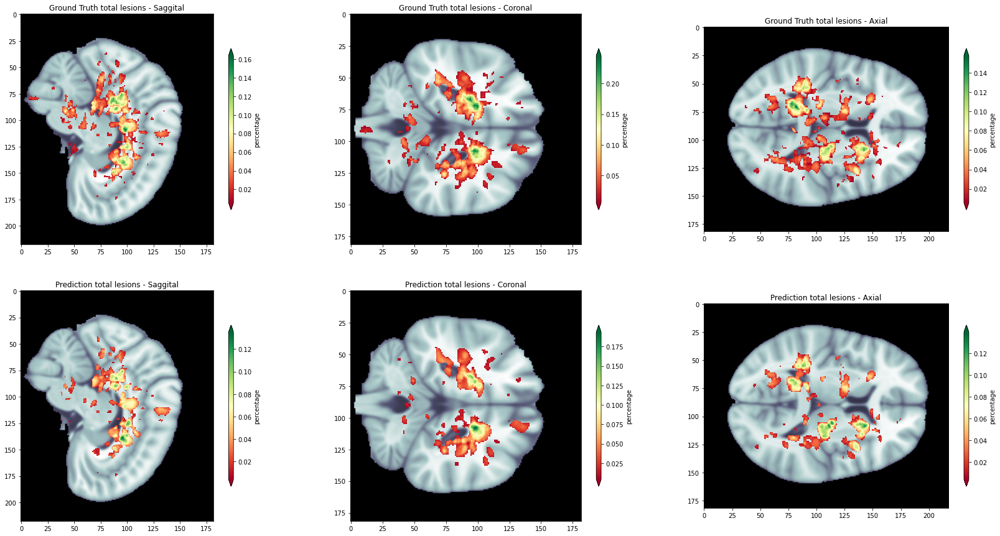

In [ ]:
slice_counter = max_idx
fig, ax = plt.subplots(2, 3, figsize=(30, 15))

ax[0][0].imshow(img[slice_counter,:,:],cmap='bone')
mask_ = np.ma.masked_where(sagital_label_percent[:,:]==0, sagital_label_percent[:,:])
im4=ax[0][0].imshow(mask_,cmap='RdYlGn')
ax[0][0].title.set_text('Ground Truth total lesions - Saggital')

ax[0][1].imshow(img[:,slice_counter,:],cmap='bone')
mask_ = np.ma.masked_where(coronal_label_percent[:,:]==0, coronal_label_percent[:,:])
ax[0][1].title.set_text('Ground Truth total lesions - Coronal')
im5=ax[0][1].imshow(mask_,cmap='RdYlGn')

ax[0][2].imshow(img[:,:,slice_counter],cmap='bone')
# mask_ = np.ma.masked_where(axial[:,:]==0, axial[:,:])
mask_ = np.ma.masked_where(axial_label_percent[:,:]==0, axial_label_percent[:,:])
im6=ax[0][2].imshow(mask_,cmap='RdYlGn')
ax[0][2].title.set_text('Ground Truth total lesions - Axial')  


ax[1][0].imshow(img[slice_counter,:,:],cmap='bone')
mask_ = np.ma.masked_where(sagital_percent[:,:]==0, sagital_percent[:,:])
im1=ax[1][0].imshow(mask_,cmap='RdYlGn')
ax[1][0].title.set_text('Prediction total lesions - Saggital')

ax[1][1].imshow(img[:,slice_counter,:],cmap='bone')
mask_ = np.ma.masked_where(coronal_percent[:,:]==0, coronal_percent[:,:])
ax[1][1].title.set_text('Prediction total lesions - Coronal')
im2=ax[1][1].imshow(mask_,cmap='RdYlGn')

ax[1][2].imshow(img[:,:,slice_counter],cmap='bone')
# mask_ = np.ma.masked_where(axial[:,:]==0, axial[:,:])
mask_ = np.ma.masked_where(axial_percent[:,:]==0, axial_percent[:,:])
im3=ax[1][2].imshow(mask_,cmap='RdYlGn')
ax[1][2].title.set_text('Prediction total lesions - Axial')  

plt.colorbar(im1,ax=ax[0][0],label='percentage', extend='both',shrink=0.7, aspect=30)
plt.colorbar(im2,ax=ax[0][1],label='percentage', extend='both',shrink=0.7, aspect=30)
plt.colorbar(im3,ax=ax[0][2],label='percentage', extend='both',shrink=0.7, aspect=30)
plt.colorbar(im4,ax=ax[1][0],label='percentage', extend='both',shrink=0.7, aspect=30)
plt.colorbar(im5,ax=ax[1][1],label='percentage', extend='both',shrink=0.7, aspect=30)
plt.colorbar(im6,ax=ax[1][2],label='percentage', extend='both',shrink=0.7, aspect=30)

plt.show()

Como se puede observar en la grafica anterior el modelo ha sido capaz de capturar la aparicion de lesiones en cada plano con gran precision, destacando de color verde los puntos de mayor densidad. Mientras que las lesiones con menor probabilidad de aparición, las que tienen un color mas rojo oscuro en la mayoria de casos no consiguen ser capturados por el modelo al ser lesiones mas pequeñas.

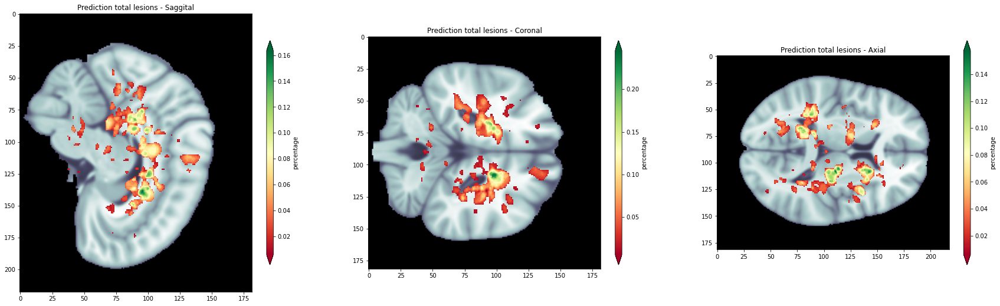

In [ ]:
slice_counter = max_idx
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(30, 10))

ax1.imshow(img[slice_counter,:,:],cmap='bone')
mask_ = np.ma.masked_where(sagital_percent[:,:]==0, sagital_percent[:,:])
im1=ax1.imshow(mask_,cmap='RdYlGn')
ax1.title.set_text('Prediction total lesions - Saggital')

ax2.imshow(img[:,slice_counter,:],cmap='bone')
mask_ = np.ma.masked_where(coronal_percent[:,:]==0, coronal_percent[:,:])
ax2.title.set_text('Prediction total lesions - Coronal')
im2=ax2.imshow(mask_,cmap='RdYlGn')

ax3.imshow(img[:,:,slice_counter],cmap='bone')
# mask_ = np.ma.masked_where(axial[:,:]==0, axial[:,:])
mask_ = np.ma.masked_where(axial_percent[:,:]==0, axial_percent[:,:])
# mask_ = np.ma.masked_where(pred[:,:,slice_counter]==0, pred[:,:,slice_counter])
im3=ax3.imshow(mask_,cmap='RdYlGn')
ax3.title.set_text('Prediction total lesions - Axial')  

plt.colorbar(im1,ax=ax1,label='percentage', extend='both',shrink=0.7, aspect=30)
plt.colorbar(im2,ax=ax2,label='percentage', extend='both',shrink=0.7, aspect=30)
plt.colorbar(im3,ax=ax3,label='percentage', extend='both',shrink=0.7, aspect=30)
plt.show()

Creamos una animacion de la imagen MNI 3D y el porcentaje total de lesiones del dataset

/usr/local/lib/python3.7/dist-packages/matplotlib/image.py:452: UserWarning: Warning: converting a masked element to nan.
  dv = np.float64(self.norm.vmax) - np.float64(self.norm.vmin)
/usr/local/lib/python3.7/dist-packages/matplotlib/image.py:459: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
/usr/local/lib/python3.7/dist-packages/matplotlib/image.py:464: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
<string>:6: UserWarning: Warning: converting a masked element to nan.
/usr/local/lib/python3.7/dist-packages/matplotlib/colors.py:993: UserWarning: Warning: converting a masked element to nan.
  data = np.asarray(value)


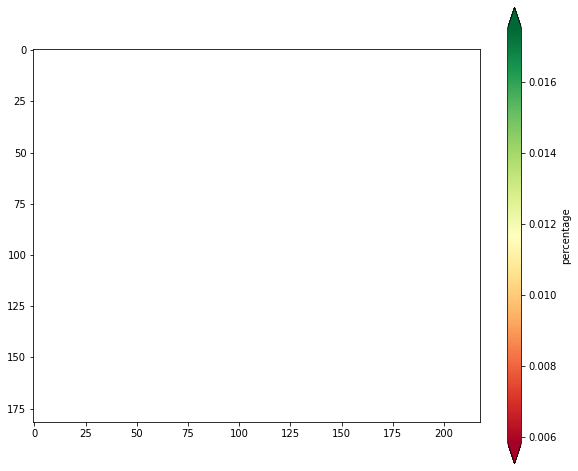

In [ ]:
fig = plt.figure(figsize=(10,12))
camera = Camera(fig)  # create the camera object from celluloid
for i in range(pred3d_percent.shape[2]):  # axial view
    plt.imshow(img[:,:,i], cmap="bone")
    mask_ = np.ma.masked_where(pred3d_percent[:,:,i]==0, pred3d_percent[:,:,i])
    im1=plt.imshow(mask_,cmap="RdYlGn")
    
    # plt.axis("off")
    camera.snap()  # Store the current slice
plt.clim(np.min(pred3d_percent[pred3d_percent != 0]), np.max(pred3d_percent))
plt.colorbar(im1, label='percentage', extend='both', shrink=0.7, aspect=30) 
animation = camera.animate()  # create the animationion

In [ ]:
from IPython.display import HTML
HTML(animation.to_html5_video())  # convert the animation to a video

/usr/local/lib/python3.7/dist-packages/matplotlib/image.py:452: UserWarning: Warning: converting a masked element to nan.
  dv = np.float64(self.norm.vmax) - np.float64(self.norm.vmin)
/usr/local/lib/python3.7/dist-packages/matplotlib/image.py:459: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
/usr/local/lib/python3.7/dist-packages/matplotlib/image.py:464: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
<string>:6: UserWarning: Warning: converting a masked element to nan.
/usr/local/lib/python3.7/dist-packages/matplotlib/colors.py:993: UserWarning: Warning: converting a masked element to nan.
  data = np.asarray(value)


El la grafica anterior se puede observar la probabilidad total de lesiones del dataset en el corte correspondiente del plano axial. 

A continuación, escogemos el sujeto 24 para analizar la lesión predicha

In [108]:
sample_path_time01 = list(sorted(root_img.glob("*_0000*")))[7]  # Choose a subject
sample_path_time02 = list(sorted(root_img.glob("*_0001*")))[7]  # Choose a subject

sample_path_pred = list(sorted(root_pred.glob("*EM_*.nii.gz")))[7]  # Choose a subject
# sample_path_label = change_img_to_label_path(sample_path)
sample_path_label = list(sorted(root_mask.glob("*EM_*")))[7]
sample_path_pred

PosixPath('/content/drive/MyDrive/TFM/nnUNet/data/nnUNet_raw/nnUNet_raw_data/Task001_EM/output/EM_024.nii.gz')

In [109]:
data_img1 = nib.load(sample_path_time01)
data_img2 = nib.load(sample_path_time02)
data_pred = nib.load(sample_path_pred)
data_label = nib.load(sample_path_label)

img1 = data_img1.get_fdata()
img2 = data_img2.get_fdata()
pred = data_pred.get_fdata()
label = data_label.get_fdata()

In [110]:
print('Tamaño de las lesiones en el ground truth =', np.sum(label[label[:,:,:]!=0]))

Tamaño de las lesiones en el ground truth = 341.0


In [111]:
print('Tamaño de las lesiones en la prediccion =',np.sum(pred[pred[:,:,:]!=0]))

Tamaño de las lesiones en la prediccion = 435.0


mostramos cortes del plano axial del sujeto con la mascara de la lesion y el ground truth

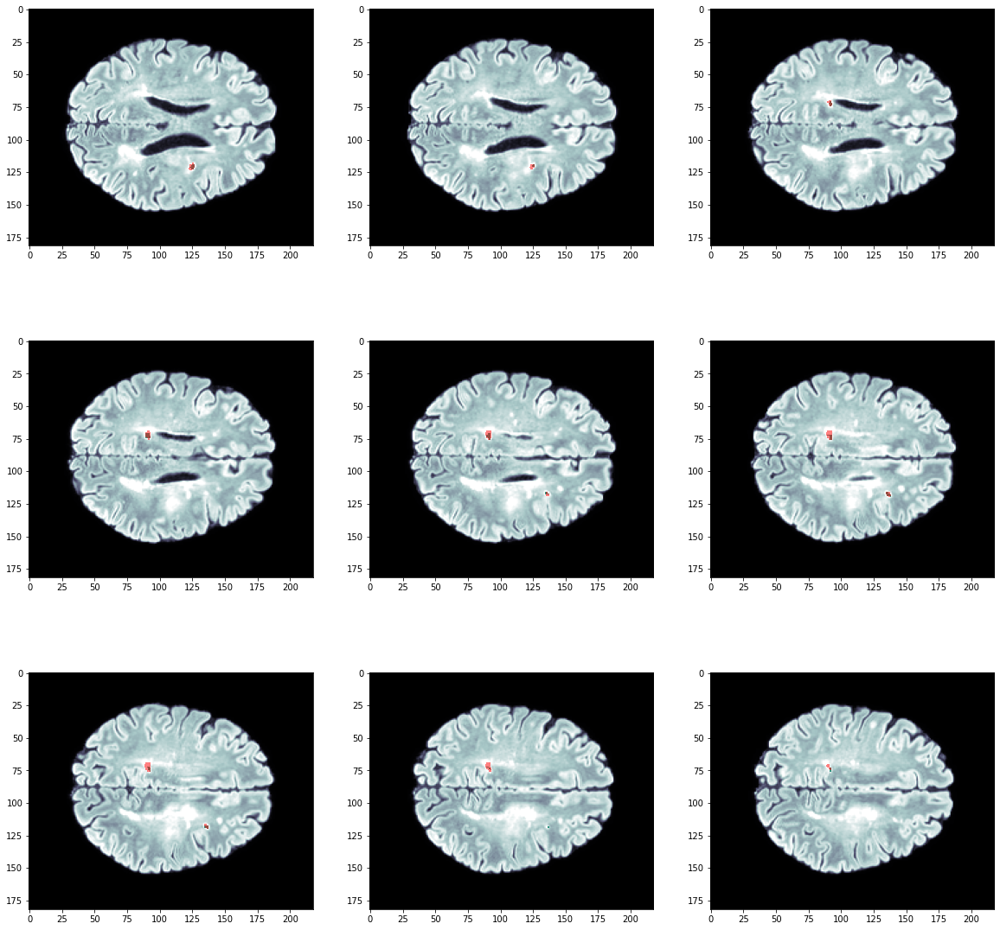

In [112]:
fig, axis = plt.subplots(3, 3, figsize=(20, 20))

slice_counter = 95
for i in range(3):
    for j in range(3):
        axis[i][j].imshow(img2[:,:,slice_counter], cmap="bone")
        mask_ = np.ma.masked_where(label[:,:,slice_counter]==0, label[:,:,slice_counter])
        axis[i][j].imshow(mask_ , cmap="summer", alpha=0.8)
        mask_ = np.ma.masked_where(pred[:,:,slice_counter]==0, pred[:,:,slice_counter])
        axis[i][j].imshow(mask_ , cmap="autumn", alpha=0.5)
        slice_counter+=1

podemos observar como se superpone la prediccion del modelo y el ground truth.

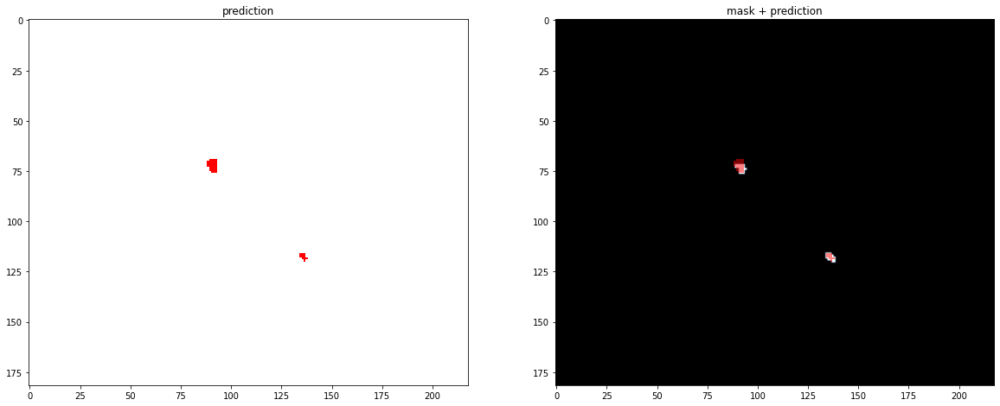

In [113]:
slice_counter = 100
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))

mask_ = np.ma.masked_where(pred[:,:,slice_counter]==0, pred[:,:,slice_counter])
ax1.imshow(mask_, cmap='autumn')
ax1.title.set_text('prediction')
ax2.imshow(label[:,:,slice_counter],cmap='bone')

ax2.imshow(mask_, cmap='autumn',alpha=0.5)
ax2.title.set_text('mask + prediction')

plt.show()

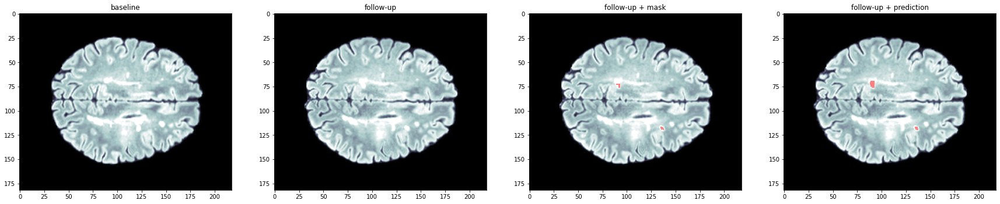

In [114]:
slice_counter = 100
fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(30, 10))

ax1.imshow(img1[:,:,slice_counter],cmap='bone')
ax1.title.set_text('baseline')
ax2.imshow(img2[:,:,slice_counter],cmap='bone')
ax2.title.set_text('follow-up')
ax3.imshow(img2[:,:,slice_counter],cmap='bone')
mask_ = np.ma.masked_where(label[:,:,slice_counter]==0, label[:,:,slice_counter])
ax3.imshow(mask_, alpha=0.5, cmap='autumn')
ax3.title.set_text('follow-up + mask')
ax4.imshow(img2[:,:,slice_counter],cmap='bone')
mask_ = np.ma.masked_where(pred[:,:,slice_counter]==0, pred[:,:,slice_counter])
ax4.imshow(mask_, alpha=0.5,cmap='autumn')
ax4.title.set_text('follow-up + prediction')
plt.show()

A continuación, creamos una animacion de la imagen follow-up y la mascara predicha

/usr/local/lib/python3.7/dist-packages/matplotlib/image.py:452: UserWarning: Warning: converting a masked element to nan.
  dv = np.float64(self.norm.vmax) - np.float64(self.norm.vmin)
/usr/local/lib/python3.7/dist-packages/matplotlib/image.py:459: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
/usr/local/lib/python3.7/dist-packages/matplotlib/image.py:464: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
<string>:6: UserWarning: Warning: converting a masked element to nan.
/usr/local/lib/python3.7/dist-packages/matplotlib/colors.py:993: UserWarning: Warning: converting a masked element to nan.
  data = np.asarray(value)


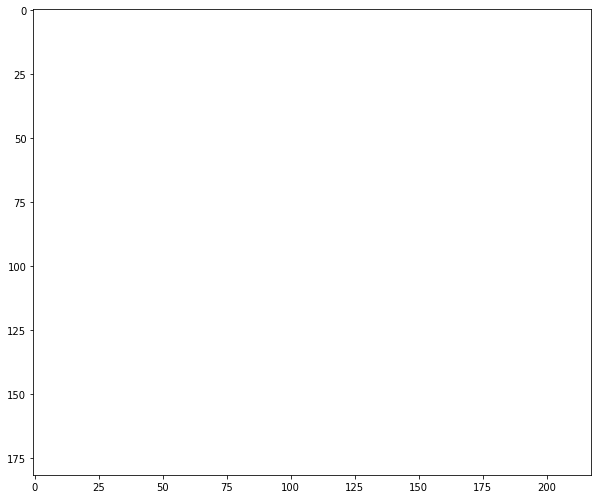

In [115]:
fig = plt.figure(figsize=(10,12))
camera = Camera(fig)  # create the camera object from celluloid

for i in range(img2.shape[2]):  # axial view
    plt.imshow(img2[:,:,i], cmap="bone")
    mask_ = np.ma.masked_where(pred[:,:,i]==0, pred[:,:,i])
    plt.imshow(mask_, cmap="autumn")
    #plt.axis("off")
    camera.snap()  # Store the current slice
animation = camera.animate()  # create the animation

In [116]:
from IPython.display import HTML
HTML(animation.to_html5_video())  # convert the animation to a video

/usr/local/lib/python3.7/dist-packages/matplotlib/image.py:452: UserWarning: Warning: converting a masked element to nan.
  dv = np.float64(self.norm.vmax) - np.float64(self.norm.vmin)
/usr/local/lib/python3.7/dist-packages/matplotlib/image.py:459: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
/usr/local/lib/python3.7/dist-packages/matplotlib/image.py:464: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
<string>:6: UserWarning: Warning: converting a masked element to nan.
/usr/local/lib/python3.7/dist-packages/matplotlib/colors.py:993: UserWarning: Warning: converting a masked element to nan.
  data = np.asarray(value)


A continuación, escogemos el sujeto 18 para analizar el ground truth con lesion y prediccion sin lesion 

In [159]:
sample_path_time01 = list(sorted(root_img.glob("*_0000*")))[3]  # Choose a subject
sample_path_time02 = list(sorted(root_img.glob("*_0001*")))[3]  # Choose a subject

sample_path_pred = list(sorted(root_pred.glob("*EM_*.nii.gz")))[3]  # Choose a subject
# sample_path_label = change_img_to_label_path(sample_path)
sample_path_label = list(sorted(root_mask.glob("*EM_*")))[3]
sample_path_pred

PosixPath('/content/drive/MyDrive/TFM/nnUNet/data/nnUNet_raw/nnUNet_raw_data/Task001_EM/output/EM_018.nii.gz')

In [160]:
data_img1 = nib.load(sample_path_time01)
data_img2 = nib.load(sample_path_time02)
data_pred = nib.load(sample_path_pred)
data_label = nib.load(sample_path_label)

img1 = data_img1.get_fdata()
img2 = data_img2.get_fdata()
pred = data_pred.get_fdata()
label = data_label.get_fdata()

In [164]:
print('Tamaño de las lesiones en el ground truth =', np.sum(label[label[:,:,:]!=0]))

Tamaño de las lesiones en el ground truth = 220.0


In [165]:
np.sum(pred[pred[:,:,:]!=0])
print('Tamaño de las lesiones en la prediccion =',np.sum(pred[pred[:,:,:]!=0]))

Tamaño de las lesiones en la prediccion = 0.0


mostramos cortes del plano axial del sujeto con el ground truth

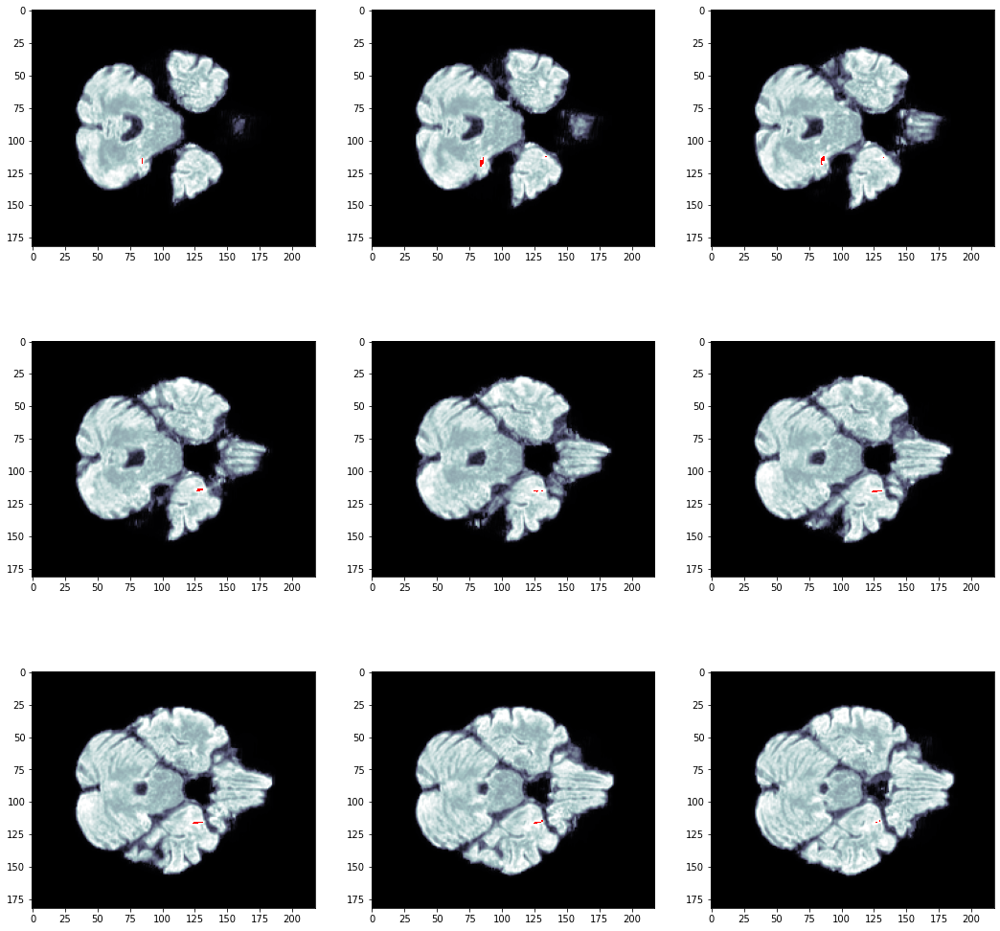

In [ ]:
fig, axis = plt.subplots(3, 3, figsize=(18, 18))

slice_counter = 45
for i in range(3):
    for j in range(3):
        axis[i][j].imshow(img2[:,:,slice_counter], cmap="bone")
        mask_ = np.ma.masked_where(label[:,:,slice_counter]==0, label[:,:,slice_counter])
        axis[i][j].imshow(mask_ , cmap="autumn")
        slice_counter+=1

/usr/local/lib/python3.7/dist-packages/matplotlib/image.py:452: UserWarning: Warning: converting a masked element to nan.
  dv = np.float64(self.norm.vmax) - np.float64(self.norm.vmin)
/usr/local/lib/python3.7/dist-packages/matplotlib/image.py:459: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
/usr/local/lib/python3.7/dist-packages/matplotlib/image.py:464: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
<string>:6: UserWarning: Warning: converting a masked element to nan.
/usr/local/lib/python3.7/dist-packages/matplotlib/colors.py:993: UserWarning: Warning: converting a masked element to nan.
  data = np.asarray(value)


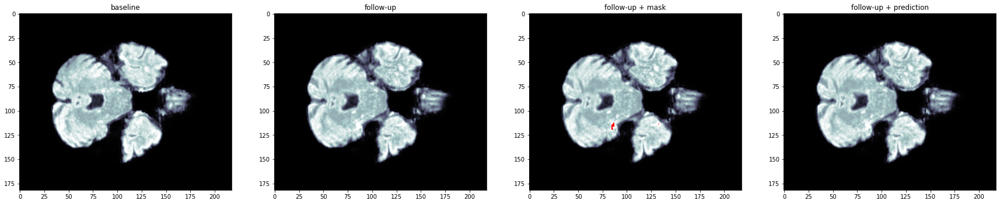

In [ ]:
slice_counter = 47
fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(30, 10))

ax1.imshow(img1[:,:,slice_counter],cmap='bone')
ax1.title.set_text('baseline')
ax2.imshow(img2[:,:,slice_counter],cmap='bone')
ax2.title.set_text('follow-up')
ax3.imshow(img2[:,:,slice_counter],cmap='bone')
mask_ = np.ma.masked_where(label[:,:,slice_counter]==0, label[:,:,slice_counter])
# ax3.imshow(pred[:,:,slice_counter], alpha=1,cmap='autumn_r')
ax3.imshow(mask_, cmap='autumn')
ax3.title.set_text('follow-up + mask')
ax4.imshow(img2[:,:,slice_counter],cmap='bone')
mask_ = np.ma.masked_where(pred[:,:,slice_counter]==0, pred[:,:,slice_counter])
ax4.imshow(mask_, alpha=0.5,cmap='autumn')
ax4.title.set_text('follow-up + prediction')
plt.show()

Como podemos observar a pesar de que el tamaño de la imagen no es pequeño el modelo no es capaz de predecir la mascara de segmentación

### Dataset de test

Exploramos los resultados de la inferencia del modelo sobre el dataset de test

In [13]:
s=len(sorted(root_pred_test.glob("*EM_*.nii.gz")))
c=0
print('listado de sujetos sin lesiones detectadas en la inferencia: \n')
for name in list(sorted(root_pred_test.glob("*EM_*.nii.gz"))):
  pred = nib.load(name)
  mask = pred.get_fdata()
  if len(mask[mask[:,:,:]!=0]) == 0:
    print(name)
    c+=1


listado de sujetos sin lesiones detectadas en la inferencia: 

/content/drive/MyDrive/TFM/nnUNet/data/nnUNet_raw/nnUNet_raw_data/Task001_EM/output_test/EM_003.nii.gz
/content/drive/MyDrive/TFM/nnUNet/data/nnUNet_raw/nnUNet_raw_data/Task001_EM/output_test/EM_006.nii.gz
/content/drive/MyDrive/TFM/nnUNet/data/nnUNet_raw/nnUNet_raw_data/Task001_EM/output_test/EM_008.nii.gz
/content/drive/MyDrive/TFM/nnUNet/data/nnUNet_raw/nnUNet_raw_data/Task001_EM/output_test/EM_009.nii.gz
/content/drive/MyDrive/TFM/nnUNet/data/nnUNet_raw/nnUNet_raw_data/Task001_EM/output_test/EM_011.nii.gz
/content/drive/MyDrive/TFM/nnUNet/data/nnUNet_raw/nnUNet_raw_data/Task001_EM/output_test/EM_016.nii.gz
/content/drive/MyDrive/TFM/nnUNet/data/nnUNet_raw/nnUNet_raw_data/Task001_EM/output_test/EM_017.nii.gz
/content/drive/MyDrive/TFM/nnUNet/data/nnUNet_raw/nnUNet_raw_data/Task001_EM/output_test/EM_019.nii.gz
/content/drive/MyDrive/TFM/nnUNet/data/nnUNet_raw/nnUNet_raw_data/Task001_EM/output_test/EM_021.nii.gz
/content/d

In [14]:
print('Total sujetos sin lesiones = {}, corresponde al {}% del total de {} sujetos'.format(c, round((c/s)*100,2),s))

Total sujetos sin lesiones = 34, corresponde al 40.96% del total de 83 sujetos


#### Analisis de lesiones del dataset

Realizamos un recuento de lesiones del dataset para cada plano de la imagen 3D y obtenemos el porcentaje de aparicion de la lesion en cada punto del plano. 
Como no disponemos del ground truth no podemos calcular las metricas de evaluación.

In [15]:
pred3d=np.zeros(pred.shape)
max=0
max_idx=0
for idx in range(len(list(sorted(root_img_test.glob("*_0000*"))))):
  # leemos el fichero de la imagen y la prediccion
  sample_path_time01 = list(sorted(root_img_test.glob("*_0000*")))[idx]  # Choose a subject
  sample_path_time02 = list(sorted(root_img_test.glob("*_0001*")))[idx]  # Choose a subject
  sample_path_pred = list(sorted(root_pred_test.glob("*EM_*.nii.gz")))[idx]  # Choose a subject
  # cargamos la imagen, la imagen y la prediccion
  data_img1 = nib.load(sample_path_time01)
  data_img2 = nib.load(sample_path_time02)
  data_pred = nib.load(sample_path_pred)
  # obtenemos la matrix de datos de la imagen y la mascara binaria. 
  img1 = data_img1.get_fdata()
  img2 = data_img2.get_fdata()
  pred = data_pred.get_fdata()
  # sumamos todos los cortes del plano sagital y axial de la imagen 3D 
  for i in range(pred.shape[2]):  # axial view, and sagital view
      if i==0 and idx==0: # inicial
        axial=pred[:,:,i]+pred[:,:,i+1]
        sagital=pred[i,:,:]+pred[i+1,:,:]
      elif i==0 and idx!=0: # inicial paciente
        axial+=pred[:,:,i]+pred[:,:,i+1]
        sagital+=pred[i,:,:]+pred[i+1,:,:]
      elif i==pred.shape[2]-1: #final
        break
      else: # intermedio
        axial+=pred[:,:,i+1]
        sagital+=pred[i+1,:,:]

      pred3d[:,:,i]+=pred[:,:,i]
      pred3d[i,:,:]+=pred[i,:,:]
      # guardamos el corte con mayor numero de lesiones
      if np.sum(pred[:,:,i]) > max:
        max=np.sum(pred[:,:,i])
        max_idx=i
  # sumamos todos los cortes del plano coronal de la imagen 3D 
  for i in range(pred.shape[1]):  # coronal view
      if i==0 and idx==0: # inicial
        coronal=pred[:,i,:]+pred[:,i+1,:]
      elif i==0 and idx!=0: # inicial paciente
        coronal+=pred[:,i,:]+pred[:,i+1,:]
      elif i==pred.shape[1]-1: #final
        break
      else: # intermedio
        coronal+=pred[:,i+1,:]

      pred3d[:,i,:]+=pred[:,i,:]
      # guardamos el corte con mayor numero de lesiones
      if np.sum(pred[:,i,:]) > max:
        max=np.sum(pred[:,i,:])
        max_idx=i

In [18]:
coronal_percent=percent(coronal)
# coronal_percent

In [19]:
sagital_percent=percent(sagital)
# sagital_percent

In [20]:
axial_percent=percent(axial)
# axial_percent

In [21]:
np.sum(pred3d[:,:,:])

75480.0

In [22]:
pred3d_percent=percent(pred3d)
# pred3d_percent[pred3d_percent != 0]

Grafica del porcentaje total de lesiones de todo el dataset

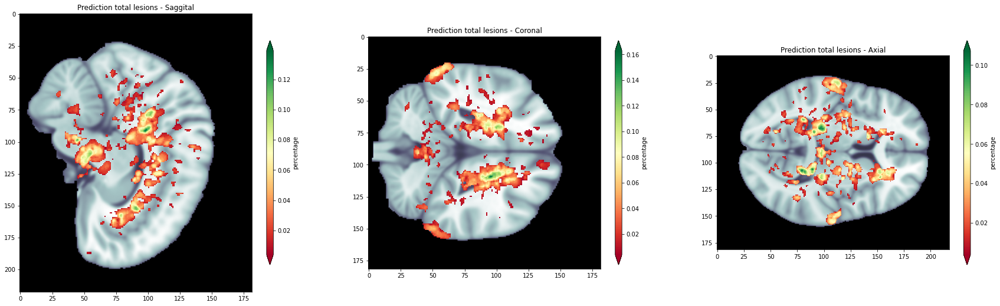

In [25]:
slice_counter = 80
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(30, 10))

ax1.imshow(img[slice_counter,:,:],cmap='bone')
mask_ = np.ma.masked_where(sagital_percent[:,:]==0, sagital_percent[:,:])
im1=ax1.imshow(mask_,cmap='RdYlGn')
ax1.title.set_text('Prediction total lesions - Saggital')

ax2.imshow(img[:,slice_counter,:],cmap='bone')
mask_ = np.ma.masked_where(coronal_percent[:,:]==0, coronal_percent[:,:])
ax2.title.set_text('Prediction total lesions - Coronal')
im2=ax2.imshow(mask_,cmap='RdYlGn')

ax3.imshow(img[:,:,slice_counter],cmap='bone')
# mask_ = np.ma.masked_where(axial[:,:]==0, axial[:,:])
mask_ = np.ma.masked_where(axial_percent[:,:]==0, axial_percent[:,:])
# mask_ = np.ma.masked_where(pred[:,:,slice_counter]==0, pred[:,:,slice_counter])
im3=ax3.imshow(mask_,cmap='RdYlGn')
ax3.title.set_text('Prediction total lesions - Axial')  

plt.colorbar(im1,ax=ax1,label='percentage', extend='both',shrink=0.7, aspect=30)
plt.colorbar(im2,ax=ax2,label='percentage', extend='both',shrink=0.7, aspect=30)
plt.colorbar(im3,ax=ax3,label='percentage', extend='both',shrink=0.7, aspect=30)
plt.show()

Como se puede observar en la grafica anterior el modelo ha sido capaz de predecir la aparicion de lesiones en cada plano, destacando de color verde los puntos de mayor densidad y las lesiones con menor probabilidad de aparición, las que tienen un color mas rojo oscuro.

Creamos una animacion de la imagen MNI 3D y el porcentaje total de lesiones del dataset

/usr/local/lib/python3.7/dist-packages/matplotlib/image.py:452: UserWarning: Warning: converting a masked element to nan.
  dv = np.float64(self.norm.vmax) - np.float64(self.norm.vmin)
/usr/local/lib/python3.7/dist-packages/matplotlib/image.py:459: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
/usr/local/lib/python3.7/dist-packages/matplotlib/image.py:464: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
<string>:6: UserWarning: Warning: converting a masked element to nan.
/usr/local/lib/python3.7/dist-packages/matplotlib/colors.py:993: UserWarning: Warning: converting a masked element to nan.
  data = np.asarray(value)


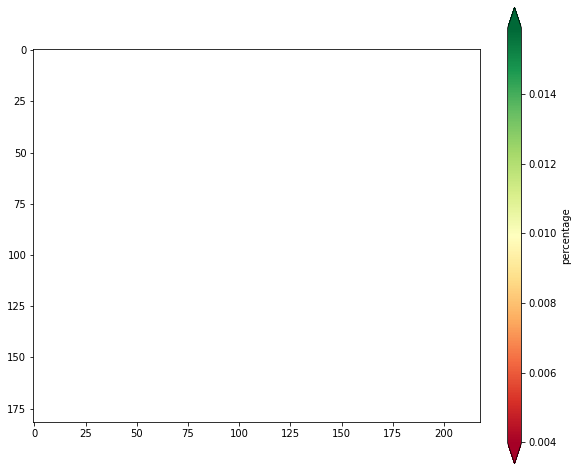

In [ ]:
fig = plt.figure(figsize=(10,12))
camera = Camera(fig)  # create the camera object from celluloid

for i in range(pred3d_percent.shape[2]):  # axial view
    plt.imshow(img[:,:,i], cmap="bone")
    mask_ = np.ma.masked_where(pred3d_percent[:,:,i]==0, pred3d_percent[:,:,i])
    im1=plt.imshow(mask_,cmap="RdYlGn")
    # plt.axis("off")
    camera.snap()  # Store the current slice
plt.clim(np.min(pred3d_percent[pred3d_percent != 0]), np.max(pred3d_percent))
plt.colorbar(im1, label='percentage', extend='both', shrink=0.7, aspect=30) 
animation = camera.animate()  # create the animationion

In [ ]:
from IPython.display import HTML
HTML(animation.to_html5_video())  # convert the animation to a video

/usr/local/lib/python3.7/dist-packages/matplotlib/image.py:452: UserWarning: Warning: converting a masked element to nan.
  dv = np.float64(self.norm.vmax) - np.float64(self.norm.vmin)
/usr/local/lib/python3.7/dist-packages/matplotlib/image.py:459: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
/usr/local/lib/python3.7/dist-packages/matplotlib/image.py:464: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
<string>:6: UserWarning: Warning: converting a masked element to nan.
/usr/local/lib/python3.7/dist-packages/matplotlib/colors.py:993: UserWarning: Warning: converting a masked element to nan.
  data = np.asarray(value)


El la grafica anterior se puede observar la probabilidad total de lesiones del dataset en el corte correspondiente del plano axial.

A continuación, escogemos el sujeto 43 para analizar la lesión predicha

In [67]:
sample_path_time01 = list(sorted(root_img_test.glob("*_0000*")))[41]  # Choose a subject
sample_path_time02 = list(sorted(root_img_test.glob("*_0001*")))[41]  # Choose a subject
print(sample_path_time01)
sample_path_pred = list(sorted(root_pred_test.glob("*EM_*.nii.gz")))[41]  # Choose a subject

data_img1 = nib.load(sample_path_time01)
data_img2 = nib.load(sample_path_time02)
data_pred = nib.load(sample_path_pred)

img1 = data_img1.get_fdata()
img2 = data_img2.get_fdata()
pred = data_pred.get_fdata()

/content/drive/MyDrive/TFM/nnUNet/data/nnUNet_raw/nnUNet_raw_data/Task001_EM/imagesTs/EM_043_0000.nii.gz


In [68]:

print('Tamaño de las lesiones en la prediccion =',np.sum(pred[pred[:,:,:]!=0]))

Tamaño de las lesiones en la prediccion = 655.0


mostramos cortes del plano axial del sujeto con la mascara de la lesion predicha sobre la imagen baseline

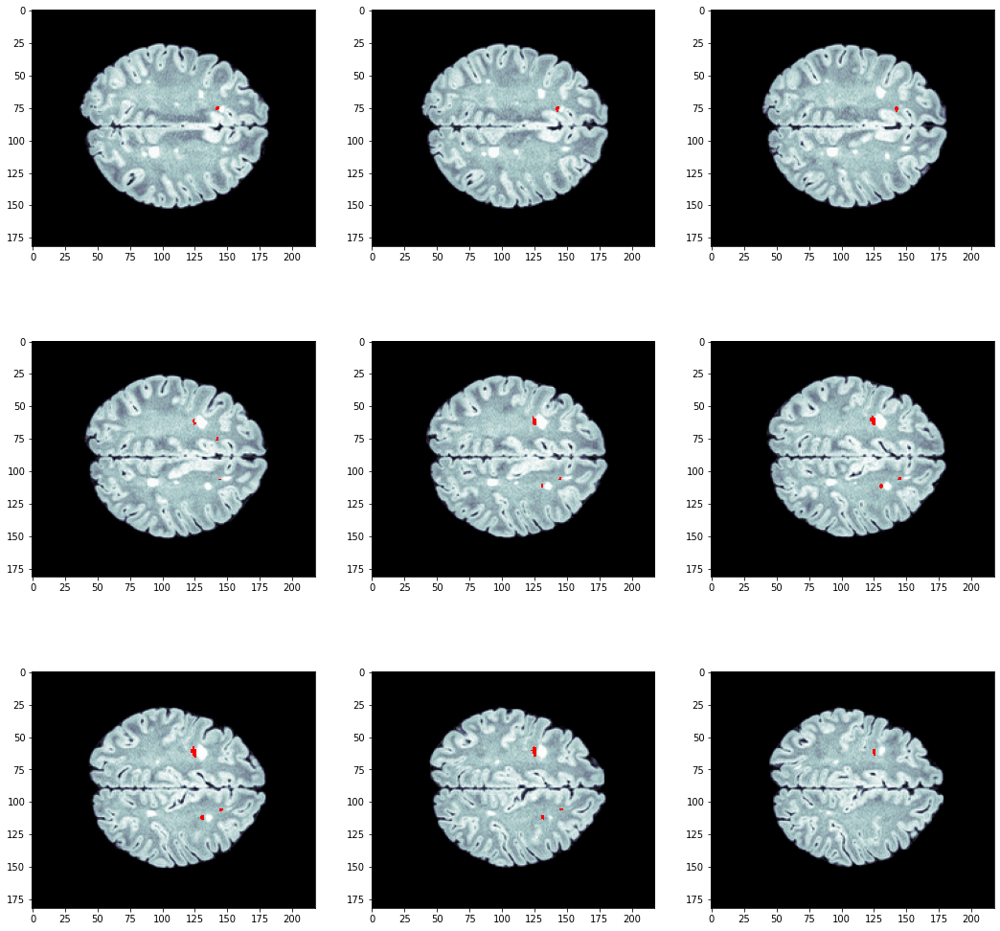

In [74]:
fig, axis = plt.subplots(3, 3, figsize=(18, 18))

slice_counter = 103
for i in range(3):
    for j in range(3):
        axis[i][j].imshow(img1[:,:,slice_counter], cmap="bone")
        mask_ = np.ma.masked_where(pred[:,:,slice_counter]==0, pred[:,:,slice_counter])
        axis[i][j].imshow(mask_ , cmap="autumn")
        slice_counter+=1

mostramos cortes del plano axial del sujeto con la mascara de la lesion predicha sobre la imagen follow-up

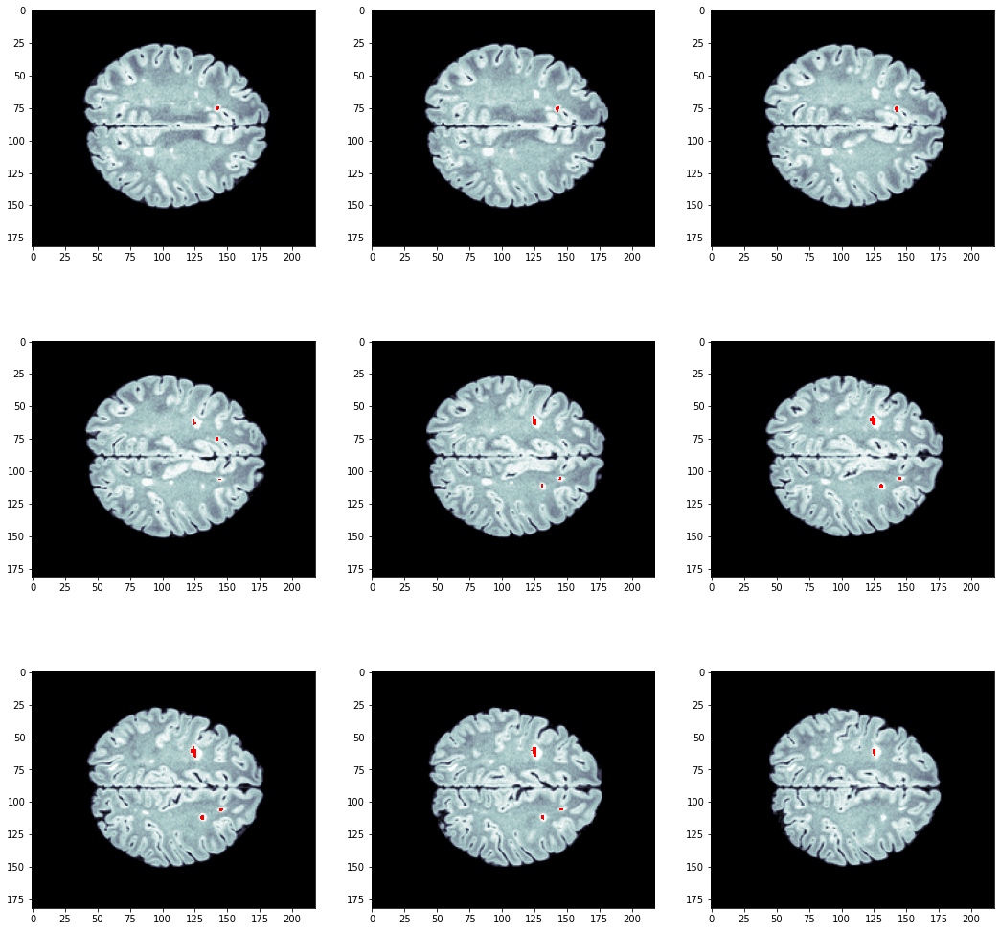

In [75]:
fig, axis = plt.subplots(3, 3, figsize=(18, 18))

slice_counter = 103
for i in range(3):
    for j in range(3):
        axis[i][j].imshow(img2[:,:,slice_counter], cmap="bone")
        mask_ = np.ma.masked_where(pred[:,:,slice_counter]==0, pred[:,:,slice_counter])
        axis[i][j].imshow(mask_ , cmap="autumn")
        slice_counter+=1

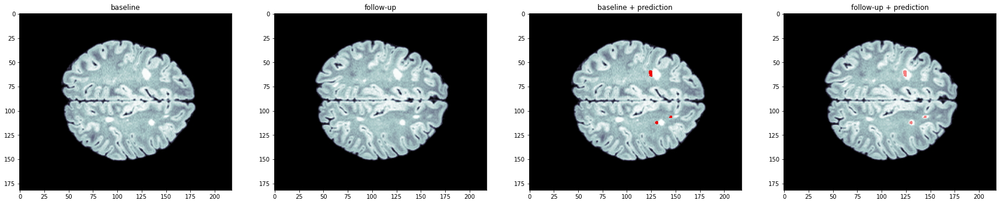

In [71]:
slice_counter = 108
fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(30, 10))

ax1.imshow(img1[:,:,slice_counter],cmap='bone')
ax1.title.set_text('baseline')
ax2.imshow(img2[:,:,slice_counter],cmap='bone')
ax2.title.set_text('follow-up')
ax3.imshow(img1[:,:,slice_counter],cmap='bone')
mask_ = np.ma.masked_where(pred[:,:,slice_counter]==0, pred[:,:,slice_counter])
ax3.imshow(mask_,cmap='autumn')
ax3.title.set_text('baseline + prediction')
ax4.imshow(img2[:,:,slice_counter],cmap='bone')
mask_ = np.ma.masked_where(pred[:,:,slice_counter]==0, pred[:,:,slice_counter])
ax4.imshow(mask_, alpha=0.5,cmap='autumn')
ax4.title.set_text('follow-up + prediction')
plt.show()

podemos observar diferencias en los puntos de aparicion de las lesiones entre la imagen baseline y follow-up, sobre todo en la lesion mas pequeña que esta mas a la derecha, podriamos decir que detecta una nueva lesion. 

A continuación, creamos una animacion de la imagen MNI 3D y el porcentaje total de lesiones del dataset

/usr/local/lib/python3.7/dist-packages/matplotlib/image.py:452: UserWarning: Warning: converting a masked element to nan.
  dv = np.float64(self.norm.vmax) - np.float64(self.norm.vmin)
/usr/local/lib/python3.7/dist-packages/matplotlib/image.py:459: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
/usr/local/lib/python3.7/dist-packages/matplotlib/image.py:464: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
<string>:6: UserWarning: Warning: converting a masked element to nan.
/usr/local/lib/python3.7/dist-packages/matplotlib/colors.py:993: UserWarning: Warning: converting a masked element to nan.
  data = np.asarray(value)


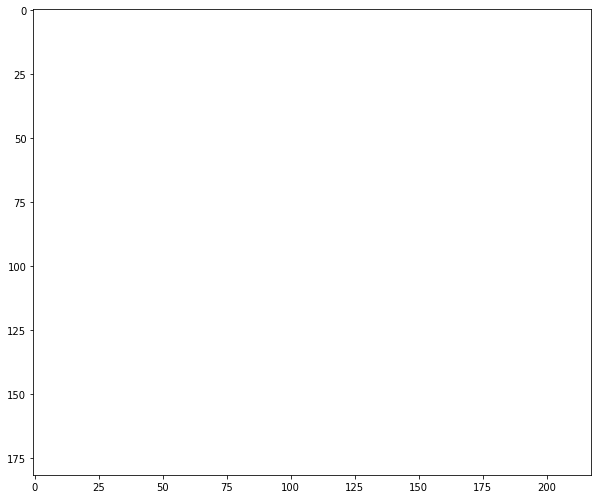

In [ ]:
fig = plt.figure(figsize=(10,12))
camera = Camera(fig)  # create the camera object from celluloid

for i in range(img2.shape[2]):  # axial view
    plt.imshow(img2[:,:,i], cmap="bone")
    mask_ = np.ma.masked_where(pred[:,:,i]==0, pred[:,:,i])
    plt.imshow(mask_, cmap="autumn")
    #plt.axis("off")
    camera.snap()  # Store the current slice
animation = camera.animate()  # create the animation

In [ ]:
from IPython.display import HTML
HTML(animation.to_html5_video())  # convert the animation to a video

/usr/local/lib/python3.7/dist-packages/matplotlib/image.py:452: UserWarning: Warning: converting a masked element to nan.
  dv = np.float64(self.norm.vmax) - np.float64(self.norm.vmin)
/usr/local/lib/python3.7/dist-packages/matplotlib/image.py:459: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
/usr/local/lib/python3.7/dist-packages/matplotlib/image.py:464: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
<string>:6: UserWarning: Warning: converting a masked element to nan.
/usr/local/lib/python3.7/dist-packages/matplotlib/colors.py:993: UserWarning: Warning: converting a masked element to nan.
  data = np.asarray(value)


In [29]:
# def save2nifti(data, affine, file_name):
#   """
#   Save data to a nifti file.

#   """
#   img = nib.Nifti1Image(data, affine)
#   nib.save(img, file_name)

In [30]:
# import os
# root_pred_test_nifti = Path('/content/drive/MyDrive/TFM/nnUNet/data/nnUNet_raw/nnUNet_raw_data/Task001_EM/output_test_nifti/')

# if not os.path.exists(root_pred_test_nifti):
#   os.mkdir(root_pred_test_nifti)

# for out in list(sorted(root_pred_test.glob("*EM_*.nii.gz"))):
#   pred = nib.load(out)
#   mask = pred.get_fdata()

#   affine=pred.affine
#   patient=out.name.split('.')[0].split('_')[1]
#   f='pred_'+patient+'.nii.gz'
#   file_name=os.path.join(root_pred_test_nifti,f)
#   print(file_name)
#   save2nifti(mask, affine, file_name)


In [35]:
sample_path_time01 = list(sorted(root_img_test.glob("*_0000*")))[80]  # Choose a subject
sample_path_time02 = list(sorted(root_img_test.glob("*_0001*")))[80]  # Choose a subject
print(sample_path_time01)
sample_path_pred = list(sorted(root_pred_test.glob("*EM_*.nii.gz")))[80]  # Choose a subject

data_img1 = nib.load(sample_path_time01)
data_img2 = nib.load(sample_path_time02)
data_pred = nib.load(sample_path_pred)

img1 = data_img1.get_fdata()
img2 = data_img2.get_fdata()
pred = data_pred.get_fdata()

/content/drive/MyDrive/TFM/nnUNet/data/nnUNet_raw/nnUNet_raw_data/Task001_EM/imagesTs/EM_083_0000.nii.gz


In [36]:

print('Tamaño de las lesiones en la prediccion =',np.sum(pred[pred[:,:,:]!=0]))

Tamaño de las lesiones en la prediccion = 410.0


mostramos cortes del plano axial del sujeto con la mascara de la lesion predicha

/usr/local/lib/python3.7/dist-packages/matplotlib/image.py:452: UserWarning: Warning: converting a masked element to nan.
  dv = np.float64(self.norm.vmax) - np.float64(self.norm.vmin)
/usr/local/lib/python3.7/dist-packages/matplotlib/image.py:459: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
/usr/local/lib/python3.7/dist-packages/matplotlib/image.py:464: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
<string>:6: UserWarning: Warning: converting a masked element to nan.
/usr/local/lib/python3.7/dist-packages/matplotlib/colors.py:993: UserWarning: Warning: converting a masked element to nan.
  data = np.asarray(value)


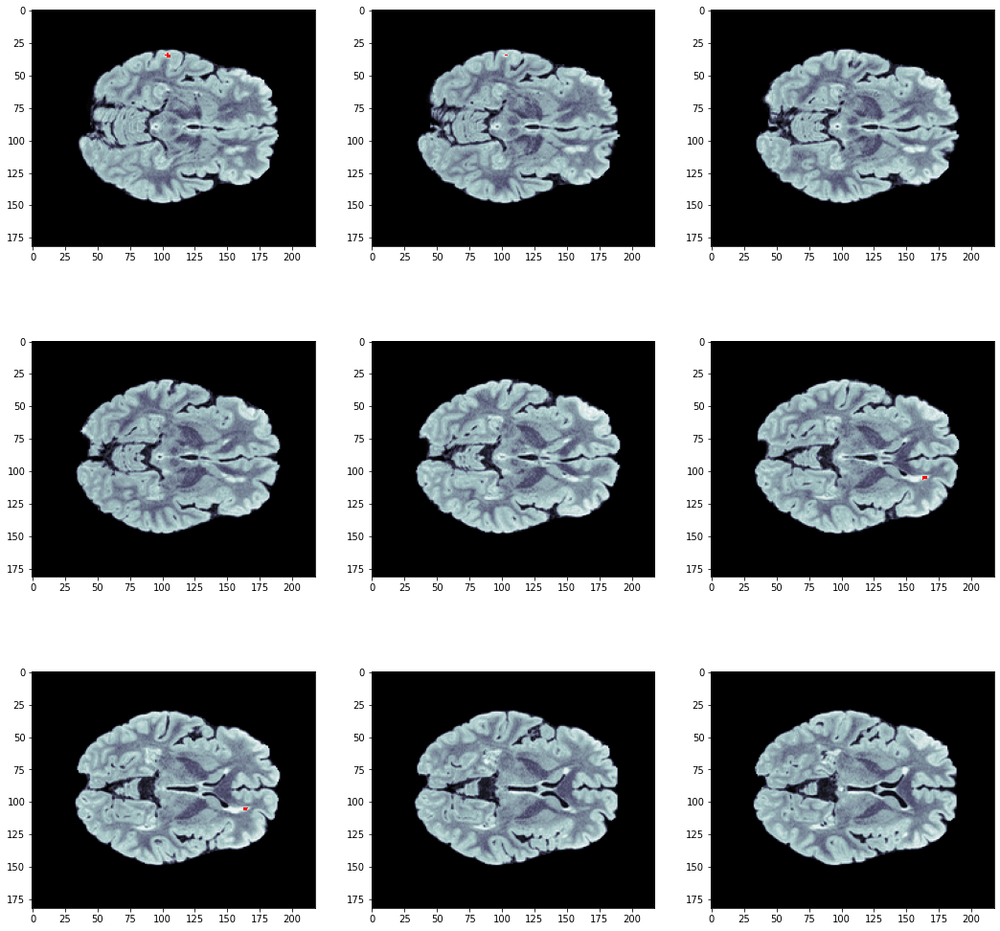

In [56]:
fig, axis = plt.subplots(3, 3, figsize=(18, 18))

slice_counter = 70
for i in range(3):
    for j in range(3):
        _=axis[i][j].imshow(img2[:,:,slice_counter], cmap="bone")
        mask_ = np.ma.masked_where(pred[:,:,slice_counter]==0, pred[:,:,slice_counter])
        _=axis[i][j].imshow(mask_ , cmap="autumn")
        slice_counter+=1

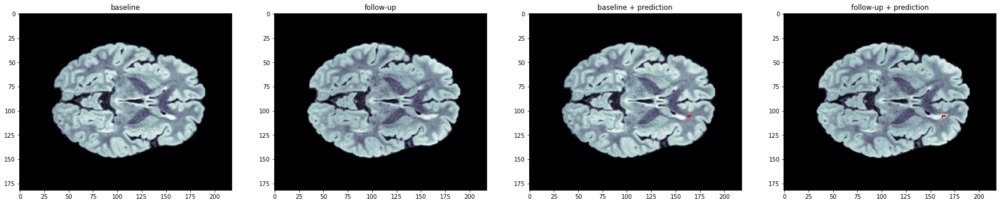

In [66]:
slice_counter = 75
fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(30, 10))

ax1.imshow(img1[:,:,slice_counter],cmap='bone')
ax1.title.set_text('baseline')
ax2.imshow(img2[:,:,slice_counter],cmap='bone')
ax2.title.set_text('follow-up')
ax3.imshow(img1[:,:,slice_counter],cmap='bone')
mask_ = np.ma.masked_where(pred[:,:,slice_counter]==0, pred[:,:,slice_counter])
ax3.imshow(mask_,cmap='autumn')
ax3.title.set_text('baseline + prediction')
ax4.imshow(img2[:,:,slice_counter],cmap='bone')
mask_ = np.ma.masked_where(pred[:,:,slice_counter]==0, pred[:,:,slice_counter])
ax4.imshow(mask_,cmap='autumn')
ax4.title.set_text('follow-up + prediction')
plt.show()

podemos observar diferencias en los puntos de aparicion de las lesiones entre la imagen baseline y follow-up, podriamos decir que detecta una nueva lesion. 

/usr/local/lib/python3.7/dist-packages/matplotlib/image.py:452: UserWarning: Warning: converting a masked element to nan.
  dv = np.float64(self.norm.vmax) - np.float64(self.norm.vmin)
/usr/local/lib/python3.7/dist-packages/matplotlib/image.py:459: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
/usr/local/lib/python3.7/dist-packages/matplotlib/image.py:464: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
<string>:6: UserWarning: Warning: converting a masked element to nan.
/usr/local/lib/python3.7/dist-packages/matplotlib/colors.py:993: UserWarning: Warning: converting a masked element to nan.
  data = np.asarray(value)


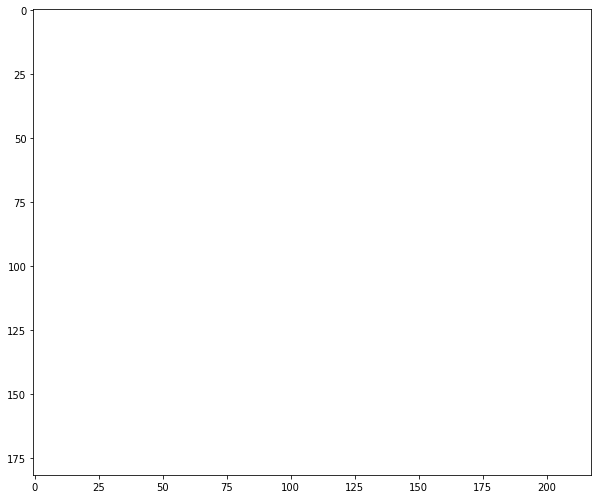

In [39]:
fig = plt.figure(figsize=(10,12))
camera = Camera(fig)  # create the camera object from celluloid

for i in range(img2.shape[2]):  # axial view
    plt.imshow(img2[:,:,i], cmap="bone")
    mask_ = np.ma.masked_where(pred[:,:,i]==0, pred[:,:,i])
    plt.imshow(mask_, cmap="autumn")
    #plt.axis("off")
    camera.snap()  # Store the current slice
animation = camera.animate()  # create the animation

In [40]:
from IPython.display import HTML
HTML(animation.to_html5_video())  # convert the animation to a video

/usr/local/lib/python3.7/dist-packages/matplotlib/image.py:452: UserWarning: Warning: converting a masked element to nan.
  dv = np.float64(self.norm.vmax) - np.float64(self.norm.vmin)
/usr/local/lib/python3.7/dist-packages/matplotlib/image.py:459: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
/usr/local/lib/python3.7/dist-packages/matplotlib/image.py:464: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
<string>:6: UserWarning: Warning: converting a masked element to nan.
/usr/local/lib/python3.7/dist-packages/matplotlib/colors.py:993: UserWarning: Warning: converting a masked element to nan.
  data = np.asarray(value)
